# CLUSTERING AND GRAPH ANALYSIS OF PATIENT READMISSIONS ON DIABETES 130-US HOSPITALS FOR YEAR 1999-2008

Adrià Matas Bosch (s232775), Luca D’Este (s233231),
Jesús Díaz Pereira (s233142), Ioannis Vlasakoudis (s232755)

In [1]:
# Built-in Python libraries
import os
import re
from collections import defaultdict

# General-purpose libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing and machine learning libraries
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, 
    precision_score, 
    recall_score, 
    f1_score, 
    confusion_matrix, 
    classification_report, 
    make_scorer
)
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    StratifiedKFold
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from category_encoders import TargetEncoder

# Graph and network libraries
import networkx as nx
from community import community_louvain
from sklearn.cluster import SpectralClustering


# Visualization setup
from matplotlib import cm
from matplotlib.colors import ListedColormap

# Statistics and sparse matrix utilities
from scipy.stats import chi2_contingency, entropy
from scipy.sparse import csr_matrix
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize

# Custom setup for visualization
%matplotlib inline
sns.set_theme(context='notebook', style='darkgrid', palette='husl')
pd.set_option('display.max_columns', None)  # Display all columns in pandas

# EDA

Import data

In [2]:
# Load the dataset
df = pd.read_csv(r"diabetic_data.csv", na_values='?', low_memory=False)  # Treat '?' as NaN
print(f"Original shape of the dataset: {df.shape}")

df = df.sample(frac=0.05, random_state=42)


# Convert the `readmitted` column into numeric form (if not already done)
readmitted_mapping = {'NO': 0, '<30': 2, '>30': 1}  # Example mapping
df['readmitted'] = df['readmitted'].map(readmitted_mapping)

# Drop any rows with missing values in 'readmitted_numeric' or other columns of interest
df = df.dropna(subset=['readmitted'])
print(f"Dataset shape after dropping missing 'readmitted': {df.shape}")

df['age'] = df['age'].map({'[0-10)':1, '[10-20)':2, '[20-30)':3, '[30-40)':4, '[40-50)':5,
                          '[50-60)':6, '[60-70)':7, '[70-80)':8, '[80-90)':9, '[90-100)':10 })

# Determine the class with the smallest number of samples (minority class)
class_counts = df['readmitted'].value_counts()
minority_class_size = class_counts.min()
print(f"Minority class size: {minority_class_size}")

# Downsample each class to the size of the minority class
balanced_dfs = []
for class_label, count in class_counts.items():
    class_subset = df[df['readmitted'] == class_label]
    downsampled_class = class_subset.sample(n=minority_class_size, random_state=42)
    balanced_dfs.append(downsampled_class)

# Combine the downsampled classes into a single balanced dataset
df = pd.concat(balanced_dfs, axis=0).reset_index(drop=True)

print(f"Shape of the balanced dataset: {df.shape}")
print(df['readmitted'].value_counts())

# Optional: Sample a smaller fraction of the balanced dataset (if needed for performance)
#df = balanced_df.sample(frac=0.01, random_state=42)
print(f"Shape of the downsampled balanced dataset: {df.shape}")

X_train = df.drop(['readmitted'],axis=1)
y_train = df['readmitted'].copy()


Original shape of the dataset: (101766, 50)
Dataset shape after dropping missing 'readmitted': (5088, 50)
Minority class size: 583
Shape of the balanced dataset: (1749, 50)
readmitted
0    583
1    583
2    583
Name: count, dtype: int64
Shape of the downsampled balanced dataset: (1749, 50)


Dividing the columns into categorical, numerical, ID and diag columns.



In [3]:
cat_cols = [
    'race', 'gender', 'weight', 'admission_type_id',
    'discharge_disposition_id', 'admission_source_id', 'payer_code',
    'medical_specialty', 'max_glu_serum',
    'A1Cresult', 'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
    'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
    'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
    'tolazamide', 'examide', 'citoglipton', 'insulin', 'glyburide-metformin',
    'glipizide-metformin', 'glimepiride-pioglitazone',
    'metformin-rosiglitazone', 'metformin-pioglitazone', 'change',
    'diabetesMed'
]

num_cols = [
    'time_in_hospital', 'num_lab_procedures', 'num_procedures',
    'num_medications', 'number_outpatient', 'number_emergency',
    'number_inpatient', 'number_diagnoses', 'age'
]

ID_cols = ["encounter_id", "patient_nbr"]

diag_cols = ['diag_1', 'diag_2', 'diag_3']


**Analyze categorical columns**

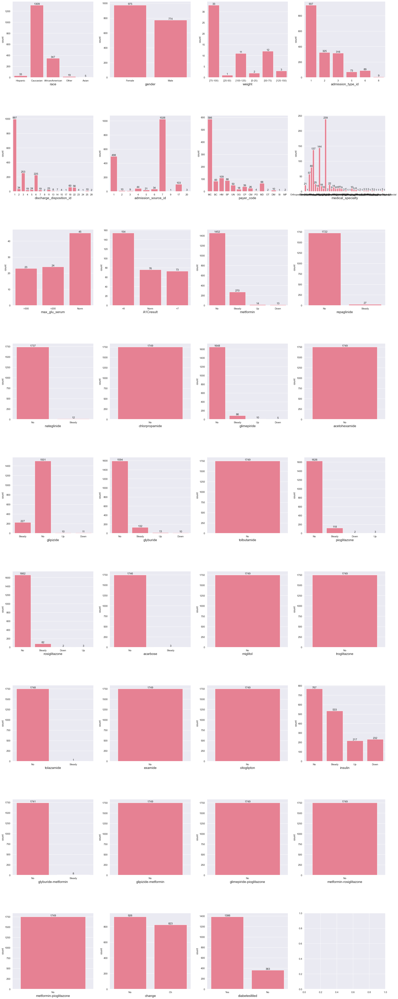

In [10]:
fig, axs = plt.subplots(nrows=9, ncols=4, figsize=(30, 80))
plt.subplots_adjust(hspace=0.5)

for column, ax in zip(cat_cols, axs.ravel()):
    sns.countplot(x=df[column], ax=ax)
    ax.set_xlabel(column, fontsize=15)
    for container in ax.containers:
        ax.bar_label(container, fontsize=12)

plt.show()

Remove columns that show no or very low variance, as they don't provide any info. Remove weight and medical_specialty since most values are missing.

We will remove all the columns that have no or very low variance, as they will not give the model any new information.

We will remove the weight and medical_specialty columns because most of them are missing.

So the columns that will be removed are:


In [11]:
cols_to_drop = ['weight','medical_specialty','chlorpropamide','acetohexamide','weight','tolbutamide',
    'acarbose','miglitol','troglitazone','tolazamide','examide','citoglipton',
    'glyburide-metformin','glipizide-metformin','glimepiride-pioglitazone',
    'metformin-rosiglitazone','metformin-pioglitazone']

df.drop(cols_to_drop,axis=1)

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
0,16202532,7113789,Hispanic,Female,6,6,1,7,4,NaN,52,0,8,0,0,0,786,250,401,3,>300,>8,No,No,No,No,Steady,No,No,No,No,No,Yes,0
1,116393658,23245515,Caucasian,Female,8,3,3,1,3,MC,39,1,33,0,0,1,715,250,414,5,NaN,NaN,Steady,No,No,No,No,Steady,No,No,Steady,Ch,Yes,0
2,252466428,47360421,Caucasian,Female,6,3,1,1,1,BC,1,1,8,0,0,0,823,250.8,714,6,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,0
3,104445024,92362221,AfricanAmerican,Female,8,6,1,17,4,NaN,55,3,21,0,0,0,996,427,428,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,0
4,71068074,3390930,Caucasian,Female,7,1,3,5,2,NaN,60,0,15,0,0,1,786,599,780,9,NaN,NaN,No,No,No,No,Steady,No,No,No,No,No,Yes,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1744,168422370,23308875,AfricanAmerican,Female,8,3,1,1,5,MC,18,0,18,0,0,0,493,135,425,6,NaN,NaN,No,No,No,No,Steady,No,No,No,Up,Ch,Yes,2
1745,25867422,3244851,AfricanAmerican,Female,7,1,5,7,13,NaN,32,2,32,0,0,0,225,336,401,8,NaN,>7,Steady,No,No,No,No,No,No,No,No,No,Yes,2
1746,9355386,97847946,Caucasian,Female,9,1,3,7,5,NaN,95,5,22,0,0,0,507,427,518,9,NaN,NaN,No,No,No,No,Steady,No,No,No,Steady,Ch,Yes,2
1747,228190254,93617955,Caucasian,Female,10,2,6,7,5,SP,28,0,5,0,0,3,562,722,250,6,NaN,NaN,No,No,No,No,No,No,No,No,Steady,No,Yes,2


**Analyze numerical columns**

In [12]:
df[num_cols].describe().T


,count,mean,std,min,25%,50%,75%,max
time_in_hospital,1749.0,4.578616,2.994316,1.0,2.0,4.0,6.0,14.0
num_lab_procedures,1749.0,44.495140,18.914042,1.0,34.0,45.0,58.0,113.0
num_procedures,1749.0,1.284162,1.686833,0.0,0.0,1.0,2.0,6.0
num_medications,1749.0,16.369354,8.114928,1.0,11.0,15.0,21.0,68.0
number_outpatient,1749.0,0.377358,1.100484,0.0,0.0,0.0,0.0,14.0
number_emergency,1749.0,0.226415,0.892487,0.0,0.0,0.0,0.0,22.0
number_inpatient,1749.0,0.767296,1.425955,0.0,0.0,0.0,1.0,16.0
number_diagnoses,1749.0,7.472842,1.890897,1.0,6.0,9.0,9.0,10.0
age,1749.0,7.118925,1.620673,1.0,6.0,7.0,8.0,10.0


Checking the distribution of numerical columns.



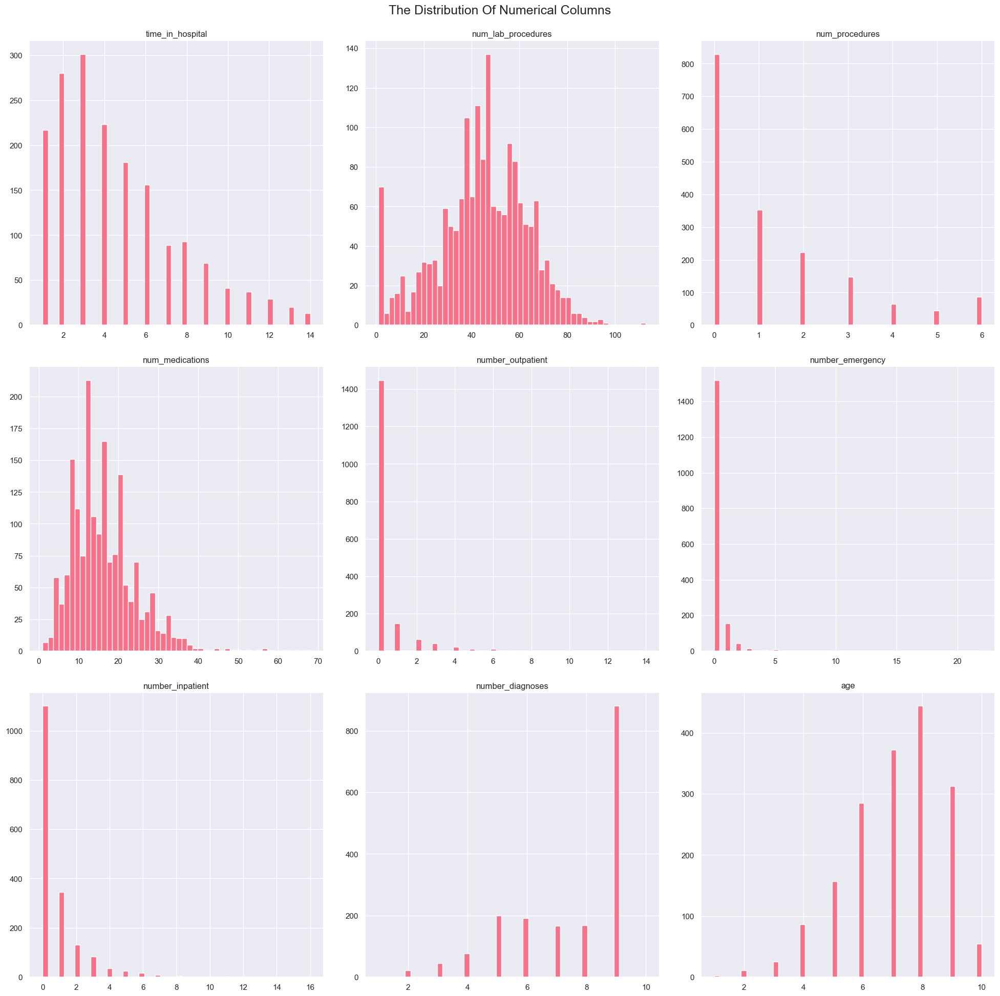

In [13]:
df[num_cols].hist(figsize=(20, 20), bins=50)
plt.suptitle('The Distribution Of Numerical Columns', fontsize=18)
plt.tight_layout(pad = 2)

Most of the columns are highly skewed.

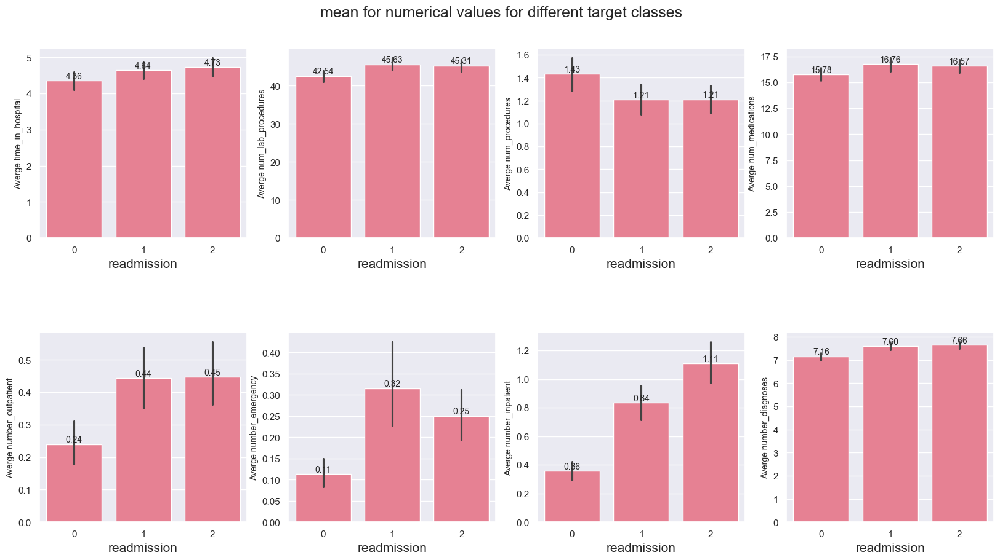

In [14]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
plt.subplots_adjust(hspace=0.5)
fig.suptitle("mean for numerical values for different target classes",
             fontsize=18,
             y=0.95)

for column, ax in zip(num_cols, axs.ravel()):
    sns.barplot(x=df['readmitted'], y=df[column], ax=ax)
    ax.set_xlabel("readmission", fontsize=15)
    ax.set_ylabel(f"Averge {column}", fontsize=10)
    for container in ax.containers:
        ax.bar_label(container, fontsize=10, fmt='%.2f')
plt.show()

We can notice that some columns, like number_outpatient, number_emergency and number_inpatient have highly different means for different classes. This means that these columns are highly correlated to the target classes, and they are associated with the highest importance (hopefully).

**Analyze ID Columns**

In [15]:
print(df.groupby(['patient_nbr'])['patient_nbr'].count().sort_values(ascending=False))


patient_nbr
94072113     3
14378787     3
333252       2
75169035     2
40816332     2
            ..
32775201     1
32738040     1
32693922     1
32631093     1
186774602    1
Name: patient_nbr, Length: 1720, dtype: int64


We decided to discard these features.

**Analyze Diagnoses Columns**

In [16]:
df[diag_cols[0]].value_counts()


diag_1
428    118
414     97
786     71
486     65
410     65
      ... 
135      1
424      1
380      1
351      1
225      1
Name: count, Length: 246, dtype: int64

# Data Preprocessing

In [17]:
X_num = [
    'time_in_hospital', 'num_lab_procedures', 'num_procedures',
    'num_medications', 'number_outpatient', 'number_emergency',
    'number_inpatient', 'number_diagnoses'
]

X_cat = [
    'race', 'gender', 'age', 'max_glu_serum', 'A1Cresult', 'metformin',
    'repaglinide', 'nateglinide', 'glimepiride', 'glipizide', 'glyburide',
    'pioglitazone', 'rosiglitazone', 'insulin', 'change', 'diabetesMed',
    'payer_code'
]

X_diag = ['diag_1', 'diag_2', 'diag_3']

X_id = ['encounter_id', "patient_nbr"]

We will apply the following for each type:

1- Categorical columns => Mode Imputer =>KeepTopValuesTransformer => Target encoder

2- Numerical columns => Median Imputer => MinMax scaler

3- Diagnosis columns => Diagnosis transformer => Mode Imputer => Target encoder


In [18]:
# Map ICD-9 codes to categories (custom grouping)
icd9_categories = {
    "Infectious and parasitic diseases": range(1, 140),
    "Neoplasms": range(140, 240),
    "Endocrine, nutritional and metabolic diseases": range(240, 280),
    "Diseases of the blood and blood-forming organs": range(280, 290),
    "Mental disorders": range(290, 320),
    "Diseases of the nervous system and sense organs": range(320, 390),
    "Diseases of the circulatory system": range(390, 460),
    "Diseases of the respiratory system": range(460, 520),
    "Diseases of the digestive system": range(520, 580),
    "Diseases of the genitourinary system": range(580, 630),
    "Complications of pregnancy, childbirth, and the puerperium": range(630, 680),
    "Diseases of the skin and subcutaneous tissue": range(680, 710),
    "Diseases of the musculoskeletal system and connective tissue": range(710, 740),
    "Congenital anomalies": range(740, 760),
    "Certain conditions originating in the perinatal period": range(760, 780),
    "Symptoms, signs, and ill-defined conditions": range(780, 800),
    "Injury and poisoning": range(800, 1000),
}

# Function to map ICD-9 code to category
def map_icd9_to_category(code):
    try:
        numeric_code = int(str(code).strip()[:3])  # Strip whitespace and convert
        for category, code_range in icd9_categories.items():
            if numeric_code in code_range:
                return category
        return "Unknown"
    except ValueError:
        if str(code).startswith('V'):
            return "Supplementary classification (V codes)"
        elif str(code).startswith('E'):
            return "External causes of injury (E codes)"
        else:
            return "Unknown"
        

for col in X_diag:
    X_train[f'{col}'] = X_train[col].apply(map_icd9_to_category)

Apply processing

In [19]:
cat_pipeline = Pipeline([("mode imputer"  , SimpleImputer(strategy="most_frequent")),
                         ("target encoder", TargetEncoder())])

num_pipeline = Pipeline([('median imputer', SimpleImputer(strategy="median")),
                         ("MinMax scaler" , MinMaxScaler())])

diag_pipeline = Pipeline([("mode imputer", SimpleImputer(strategy="most_frequent")),
                          ("target encoder", TargetEncoder())])

full_pipeline = ColumnTransformer(transformers=[("num", num_pipeline, X_num),
                                                ("cat", cat_pipeline, X_cat),
                                                ("diag", diag_pipeline, X_diag)],
    verbose_feature_names_out=False  # Optional, you may override feature names
    ) # remove other columns

X_train = X_train.drop(cols_to_drop,axis=1)
X_train = X_train.drop(X_id,axis=1)

In [20]:
if y_train.dtype == 'object':
    y_train = y_train.astype('category').cat.codes
    
    
# This is just for testing, we don't want to transform it yet
X_train_prepared = full_pipeline.fit_transform(X_train,y_train)

    
print("Shape of X_train:", X_train_prepared.shape)

Shape of X_train: (1749, 28)


# Graph Creation

Apply preprocessing and CV on a Random Forest to get the importances of the features

In [21]:
# Define the classifier
classifier = RandomForestClassifier(n_estimators = 500,random_state=42)

# Full pipeline (Preprocessing + Random Forest)
model_pipeline = Pipeline([
    ('preprocessor', full_pipeline),
    ('classifier', classifier)
])

# Define F1 scorer
f1_scorer = make_scorer(f1_score, average='macro')  # Fixed the `average` parameter

# Define Stratified K-Fold CV to preserve class distribution
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize feature importance and metrics containers
all_feature_importances = []
metrics = {"accuracy": [], "precision": [], "recall": [], "f1_score": []}

# CV with Random Forest and full pipeline
for train_idx, val_idx in cv.split(X_train, y_train):
    # Split data into training and validation
    print(X_train.shape)
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Fit the pipeline on the current fold
    model_pipeline.fit(X_train_fold, y_train_fold)
    
    # Extract feature importances
    rf_importances = model_pipeline.named_steps['classifier'].feature_importances_
    all_feature_importances.append(rf_importances)
    
    # Make predictions
    y_pred = model_pipeline.predict(X_val_fold)
    
    # Calculate metrics for the fold
    metrics["accuracy"].append(accuracy_score(y_val_fold, y_pred))
    metrics["precision"].append(precision_score(y_val_fold, y_pred, average='macro'))
    metrics["recall"].append(recall_score(y_val_fold, y_pred, average='macro'))
    metrics["f1_score"].append(f1_score(y_val_fold, y_pred, average='macro'))

# Aggregate feature importances across folds (mean)
aggregated_importances = np.mean(all_feature_importances, axis=0)

# Aggregate metrics across folds
mean_metrics = {metric: np.mean(scores) for metric, scores in metrics.items()}
std_metrics = {metric: np.std(scores) for metric, scores in metrics.items()}

# Display results
print("\nCross-Validation Metrics Summary:")
for metric in metrics.keys():
    print(f"{metric.capitalize()}: Mean = {mean_metrics[metric]:.4f}, Std Dev = {std_metrics[metric]:.4f}")

(1749, 31)
(1749, 31)
(1749, 31)
(1749, 31)
(1749, 31)

Cross-Validation Metrics Summary:
Accuracy: Mean = 0.4174, Std Dev = 0.0223
Precision: Mean = 0.4138, Std Dev = 0.0222
Recall: Mean = 0.4173, Std Dev = 0.0221
F1_score: Mean = 0.4136, Std Dev = 0.0218


We threshold to just keep the most important features

In [22]:
def map_col_names(colname):
    if colname.startswith('num'):
        return colname[4:]
    elif colname.startswith('cat'):
        return X_cat[int(colname.split('_')[1])]
    elif colname.startswith('diag'):
        idx = int(colname.split('_')[1])
        if idx == 0:
            return 'diag_1'
        elif idx == 1:
            return 'diag_2'
        elif idx == 2:
            return 'diag_3'
    else:
        return colname

# Extract transformed feature names from the ColumnTransformer
def get_prefixed_transformed_feature_names(column_transformer, original_feature_names):
    transformed_names = []
    for name, transformer, columns in column_transformer.transformers_:
        if transformer == 'drop':
            continue  # Skip dropped columns
        elif transformer == 'passthrough':
            # Append passthrough columns with prefix
            transformed_names.extend([f"{name}_{col}" for col in columns])
        else:
            if hasattr(transformer, 'get_feature_names_out'):
                # Use the transformer to get feature names
                raw_feature_names = transformer.get_feature_names_out()
                prefixed_names = [map_col_names(f"{name}_{col}") for col in raw_feature_names]
                transformed_names.extend(prefixed_names)
            else:
                # Use original column names with prefix if `get_feature_names_out` is not available
                transformed_names.extend([map_col_names(f"{name}_{col}") for col in columns])
    return transformed_names

# Apply the function to get feature names
transformed_feature_names = get_prefixed_transformed_feature_names(
    full_pipeline,  
    original_feature_names=X_train.columns.tolist())


# Filter and sort features based on importance threshold
importance_threshold = 0.02 
important_features = [
    (feature, importance) for feature, importance in zip(transformed_feature_names, aggregated_importances)
    if importance >= importance_threshold]

important_features.sort(key=lambda x: x[1], reverse=True)

# Extract the names of valid selected features
valid_selected_features = [feature[0] for feature in important_features]

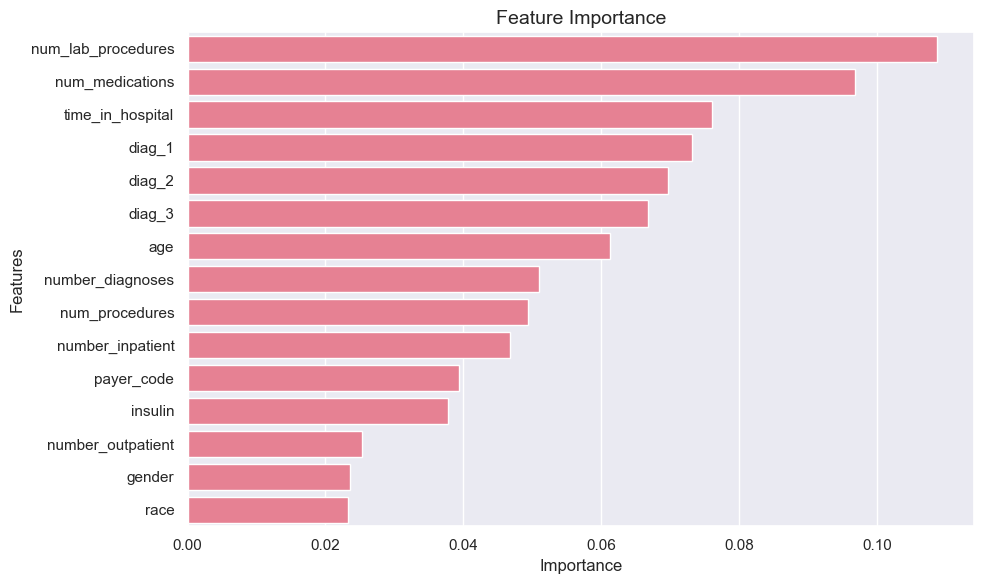

In [23]:
important_features_df = pd.DataFrame(important_features, columns=['Feature', 'Importance'])
important_features_df = important_features_df.sort_values(by='Importance', ascending=False)

# Create barplot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=important_features_df)
plt.title('Feature Importance', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()


Now we build the network. We integrate feature importances to scale the data:

# Louvain Community Detection

In [24]:
# Re-transform the full dataset to align with selected features
X_transformed = model_pipeline.named_steps['preprocessor'].transform(X_train)
X_selected = X_transformed[:, [transformed_feature_names.index(f) for f in valid_selected_features]]

# Ensure X_selected is a sparse matrix
X_selected_sparse = csr_matrix(X_selected)

# Compute weighted feature importance as a sparse matrix
importance_vector = csr_matrix([aggregated_importances[transformed_feature_names.index(f)] for f in valid_selected_features]).T

# Apply scaling, normalization, and graph creation
X_scaled = X_selected_sparse.multiply(importance_vector.T)
X_scaled_normalized = normalize(X_scaled, axis=1, norm='l2')
similarity_matrix = cosine_similarity(X_scaled_normalized)

# Sparsify using k-nearest neighbors
k_neighbors = 5
for i in range(similarity_matrix.shape[0]):
    top_k_indices = np.argsort(similarity_matrix[i, :])[-k_neighbors:]
    mask = np.zeros(similarity_matrix.shape[1])
    mask[top_k_indices] = 1
    similarity_matrix[i, :] *= mask

# Symmetrize and add epsilon
similarity_matrix = (similarity_matrix + similarity_matrix.T) / 2
epsilon = 1e-4
#similarity_matrix += epsilon * np.ones_like(similarity_matrix)
np.fill_diagonal(similarity_matrix, 0)

# Build graph
G = nx.from_numpy_array(similarity_matrix)
if not nx.is_connected(G):
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()

# Apply Louvain community detection
partition = community_louvain.best_partition(G)


# Calculate modularity
modularity_score = nx.community.modularity(
    G, [list(np.where(np.array(list(partition.values())) == c)[0]) for c in set(partition.values())]
)
print(f"Modularity score: {modularity_score}")

Modularity score: 0.7658509932190468


**Analyze inside the communities**

In [25]:
# Louvain community partition
# `partition` is a dictionary where keys are node IDs and values are community IDs
community_labels = pd.Series(partition, name="Community")

# Add `readmitted` labels to the community data
node_data = pd.DataFrame({
    "Node": list(partition.keys()),
    "Community": list(partition.values()),
    "Readmitted": df['readmitted'].iloc[:len(partition)].values
})

# Group nodes by community
grouped = node_data.groupby("Community")

# Analyze distribution of `readmitted` in each community
readmitted_distribution = grouped["Readmitted"].value_counts(normalize=True).unstack(fill_value=0)

print("Distribution of 'readmitted' in each community:")
print(readmitted_distribution)


Distribution of 'readmitted' in each community:
Readmitted         0         1         2
Community                               
0           0.293651  0.404762  0.301587
1           0.548387  0.215054  0.236559
2           0.424528  0.330189  0.245283
3           0.265487  0.336283  0.398230
4           0.210000  0.420000  0.370000
5           0.160000  0.520000  0.320000
6           0.402597  0.324675  0.272727
7           0.230769  0.384615  0.384615
8           0.370166  0.276243  0.353591
9           0.346821  0.335260  0.317919
10          0.303704  0.400000  0.296296
11          0.361905  0.295238  0.342857
12          0.265734  0.314685  0.419580
13          0.245902  0.393443  0.360656
14          0.437500  0.275000  0.287500
15          0.291667  0.333333  0.375000
16          0.421053  0.236842  0.342105
17          0.241379  0.310345  0.448276
18          0.437500  0.312500  0.250000



Community Entropies (Lower values indicate higher homogeneity):
Community
0     1.568830
1     1.444108
2     1.549904
3     1.565654
4     1.529198
5     1.439628
6     1.566590
7     1.548581
8     1.573764
9     1.584044
10    1.570885
11    1.579782
12    1.558696
13    1.557787
14    1.550999
15    1.577429
16    1.547005
17    1.537756
18    1.546180
dtype: float64


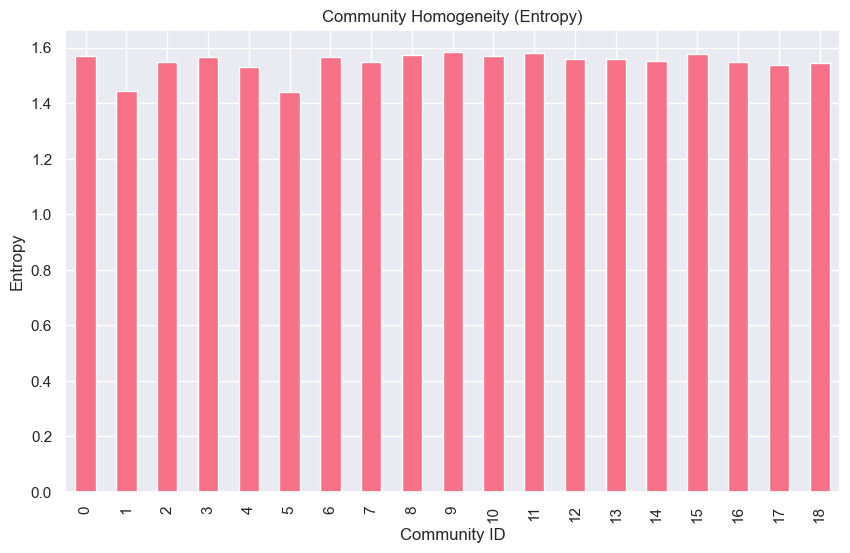

In [26]:
def compute_entropy(distribution):
    return entropy(distribution, base=2)

# Calculate entropy for each community
community_entropies = readmitted_distribution.apply(compute_entropy, axis=1)
print("\nCommunity Entropies (Lower values indicate higher homogeneity):")
print(community_entropies)

# Visualize entropy
community_entropies.plot(kind='bar', figsize=(10, 6), title="Community Homogeneity (Entropy)")
plt.ylabel("Entropy")
plt.xlabel("Community ID")
plt.show()


In [27]:
# Create contingency table for Chi-Square test
contingency_table = pd.crosstab(node_data['Community'], node_data['Readmitted'])

# Perform Chi-Square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Square Test Results:")
print(f"Chi2 Statistic: {chi2:.4f}")
print(f"P-Value: {p_value:.4e}")

if p_value < 0.05:
    print("The distribution of 'readmitted' values is significantly different across communities.")
else:
    print("No significant difference in 'readmitted' values across communities.")



Chi-Square Test Results:
Chi2 Statistic: 70.5428
P-Value: 5.0616e-04
The distribution of 'readmitted' values is significantly different across communities.


C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3288844024.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(unique_communities))


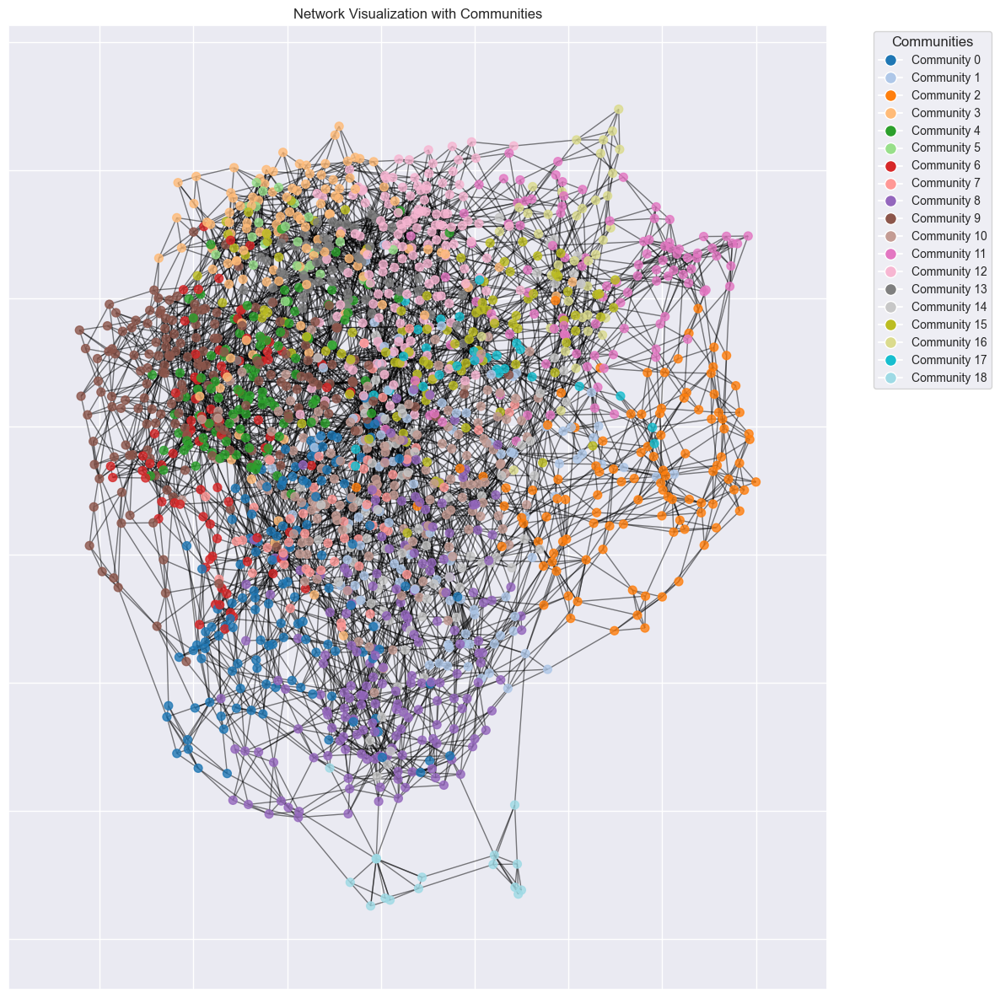

In [30]:
import matplotlib.colors as mcolors

# Generate a colormap for the communities
unique_communities = list(set(partition.values()))
colormap = cm.get_cmap('tab20', len(unique_communities))
color_mapping = {community: colormap(i) for i, community in enumerate(unique_communities)}

# Draw the graph
pos = nx.spring_layout(G)  # Use spring layout for aesthetics
plt.figure(figsize=(12, 12))

# Draw nodes with community-based colors
node_colors = [color_mapping[partition[node]] for node in G.nodes()]
nx.draw_networkx_nodes(
    G, pos, node_size=50, node_color=node_colors, alpha=0.8
)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Add a legend for the communities
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(color), markersize=10, label=f'Community {community}')
    for community, color in color_mapping.items()
]
plt.legend(handles=handles, title="Communities", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')

# Add title and display the graph
plt.title("Network Visualization with Communities")
plt.tight_layout()
plt.show()

In [31]:
merged_df = df.merge(node_data[['Node', 'Community']], 
                     left_index=True, 
                     right_on='Node', 
                     how='left').drop(columns=['Node'])

for col in X_diag:
    merged_df[f'{col}'] = merged_df[col].apply(map_icd9_to_category)
merged_df.head(10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,Community
0,16202532,7113789,Hispanic,Female,6,NaN,6,1,7,4,NaN,NaN,52,0,8,0,0,0,"Symptoms, signs, and ill-defined conditions","Endocrine, nutritional and metabolic diseases",Diseases of the circulatory system,3,>300,>8,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,0,0
1,116393658,23245515,Caucasian,Female,8,NaN,3,3,1,3,MC,Orthopedics-Reconstructive,39,1,33,0,0,1,Diseases of the musculoskeletal system and con...,"Endocrine, nutritional and metabolic diseases",Diseases of the circulatory system,5,NaN,NaN,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0,1
2,252466428,47360421,Caucasian,Female,6,NaN,3,1,1,1,BC,Ophthalmology,1,1,8,0,0,0,Injury and poisoning,"Endocrine, nutritional and metabolic diseases",Diseases of the musculoskeletal system and con...,6,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,2
3,104445024,92362221,AfricanAmerican,Female,8,NaN,6,1,17,4,NaN,Surgery-General,55,3,21,0,0,0,Injury and poisoning,Diseases of the circulatory system,Diseases of the circulatory system,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,3
4,71068074,3390930,Caucasian,Female,7,NaN,1,3,5,2,NaN,NaN,60,0,15,0,0,1,"Symptoms, signs, and ill-defined conditions",Diseases of the genitourinary system,"Symptoms, signs, and ill-defined conditions",9,NaN,NaN,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,0,4
5,87553998,55015299,Hispanic,Female,7,NaN,1,1,7,4,NaN,Cardiology,48,0,21,2,1,1,"Symptoms, signs, and ill-defined conditions",Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases",9,NaN,NaN,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0,9
6,31036224,16269912,Caucasian,Male,8,NaN,1,1,7,8,NaN,Family/GeneralPractice,35,6,17,0,0,0,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,9,NaN,>8,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0,6
7,320189216,43869339,Caucasian,Male,9,NaN,1,14,7,5,BC,NaN,58,1,19,0,0,0,Diseases of the genitourinary system,Diseases of the circulatory system,Diseases of the genitourinary system,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,7
8,28901142,23650704,Caucasian,Female,8,NaN,5,1,17,1,NaN,Nephrology,17,2,14,0,1,0,Diseases of the genitourinary system,Diseases of the genitourinary system,Diseases of the circulatory system,5,>200,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,0,2
9,49564668,827550,Caucasian,Male,8,NaN,1,3,7,3,NaN,Pulmonology,38,0,11,0,0,0,Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases",Diseases of the circulatory system,6,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,0,8


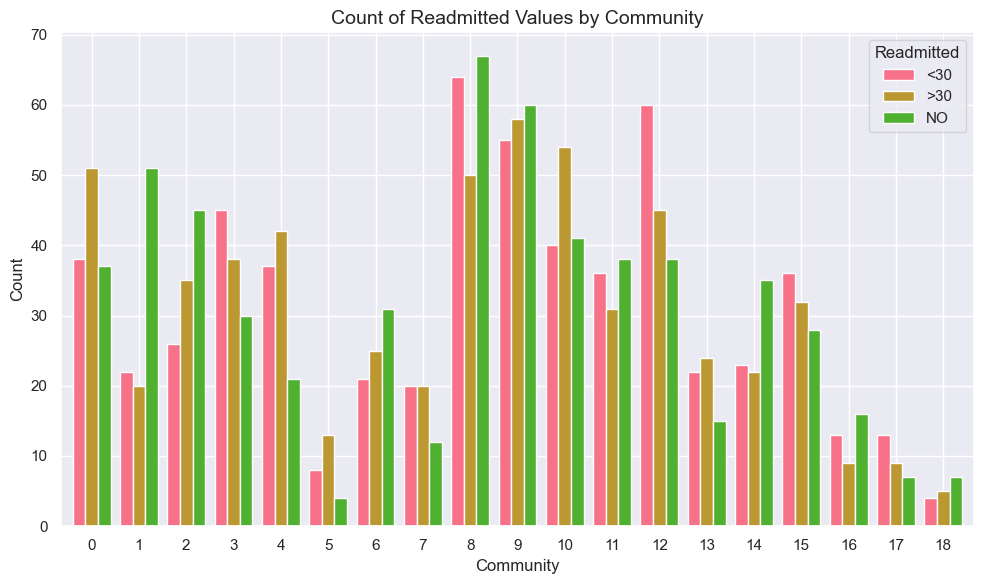

In [32]:
# Mapping for readmitted values
readmitted_mapping = {0: 'NO', 2: '<30', 1: '>30'}
merged_df['readmitted'] = merged_df['readmitted'].map(readmitted_mapping)

# Count readmitted values per community
count_data = merged_df.groupby(['Community', 'readmitted']).size().reset_index(name='count')

# Pivot the data to prepare for side-by-side bar plotting
pivoted_data = count_data.pivot(index='Community', columns='readmitted', values='count').fillna(0)

# Reorder columns in the desired order
pivoted_data = pivoted_data[['<30', '>30', 'NO']]

# Plot the data
pivoted_data.plot(kind='bar', figsize=(10, 6), width=0.8)

# Customize the plot
plt.title('Count of Readmitted Values by Community', fontsize=14)
plt.xlabel('Community', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Readmitted', loc='upper right')  # Adjust legend location if needed
plt.tight_layout()

# Show the plot
plt.show()

Analysis approach: Do a Profiling of only the communities where one of the unique Readmitted values is above a certain % treshold

In [33]:
# Calculate the counts of each readmitted value per Community
readmitted_counts = merged_df.groupby(['Community', 'readmitted']).size().reset_index(name='count')

# Calculate the total counts per Community
total_counts = merged_df.groupby('Community').size().reset_index(name='total')

# Merge the counts with the totals
percentage_data = readmitted_counts.merge(total_counts, on='Community')

# Calculate the percentage
percentage_data['percentage'] = (percentage_data['count'] / percentage_data['total']) * 100

# Display the result
percentage_data

,Community,readmitted,count,total,percentage
0,0,<30,38,126,30.158730
1,0,>30,51,126,40.476190
2,0,NO,37,126,29.365079
3,1,<30,22,93,23.655914
4,1,>30,20,93,21.505376
5,1,NO,51,93,54.838710
6,2,<30,26,106,24.528302
7,2,>30,35,106,33.018868
8,2,NO,45,106,42.452830
9,3,<30,45,113,39.823009


In [34]:
skeewed_communitites = percentage_data[percentage_data['percentage']>=40]
skeewed_communitites

,Community,readmitted,count,total,percentage
1,0,>30,51,126,40.476190
5,1,NO,51,93,54.838710
8,2,NO,45,106,42.452830
13,4,>30,42,100,42.000000
16,5,>30,13,25,52.000000
20,6,NO,31,77,40.259740
31,10,>30,54,135,40.000000
36,12,<30,60,143,41.958042
44,14,NO,35,80,43.750000
50,16,NO,16,38,42.105263


In [35]:
reduced_labels = merged_df.copy()
reduced_labels['diag_1'] = merged_df['diag_1'].str.slice(0, 25)
reduced_labels['diag_2'] = merged_df['diag_2'].str.slice(0, 25)
reduced_labels['diag_3'] = merged_df['diag_3'].str.slice(0, 25)
reduced_labels['diag_1']

0       Symptoms, signs, and ill-
1       Diseases of the musculosk
2            Injury and poisoning
3            Injury and poisoning
4       Symptoms, signs, and ill-
                  ...            
1744    Diseases of the respirato
1745                    Neoplasms
1746    Diseases of the respirato
1747    Diseases of the digestive
1748    Complications of pregnanc
Name: diag_1, Length: 1749, dtype: object

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


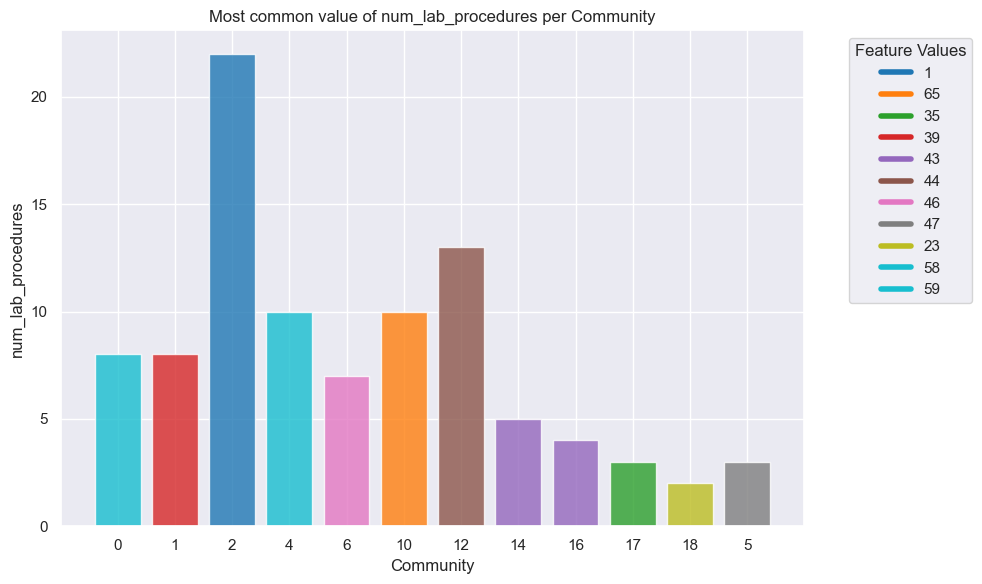

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


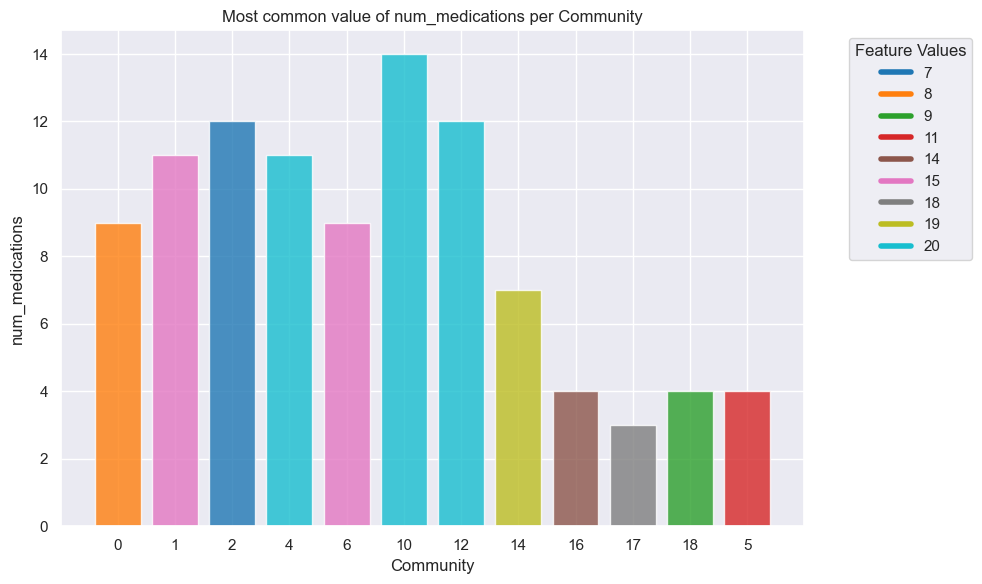

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


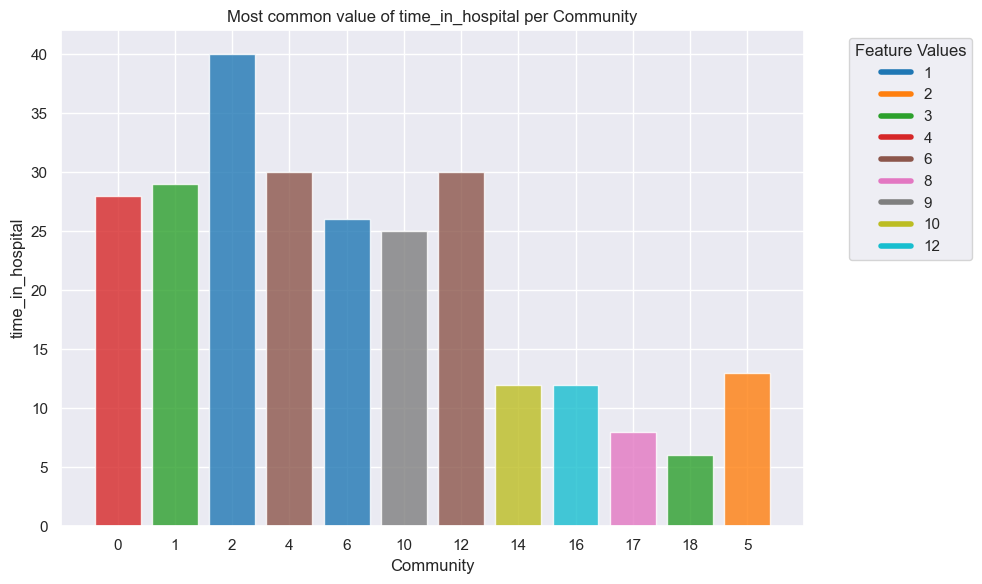

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


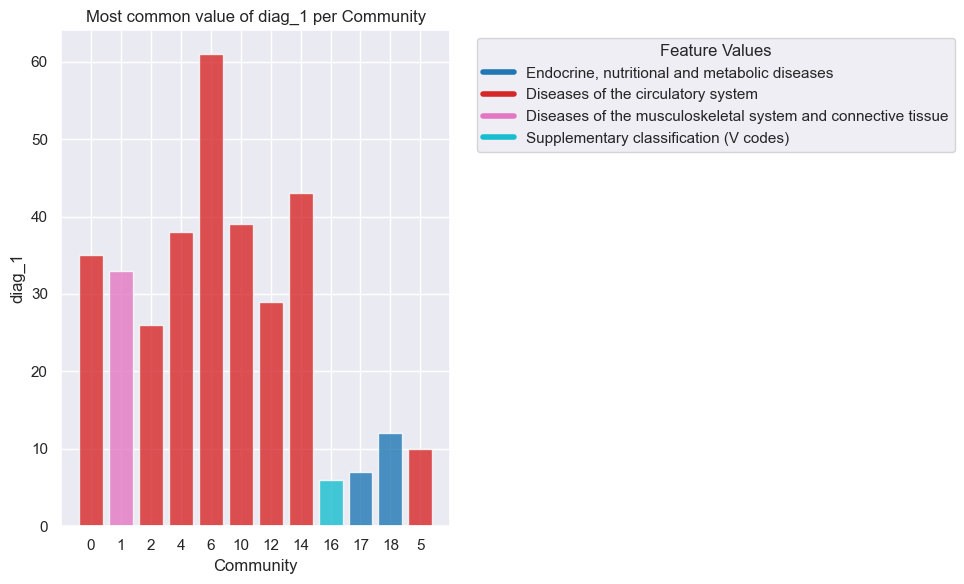

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


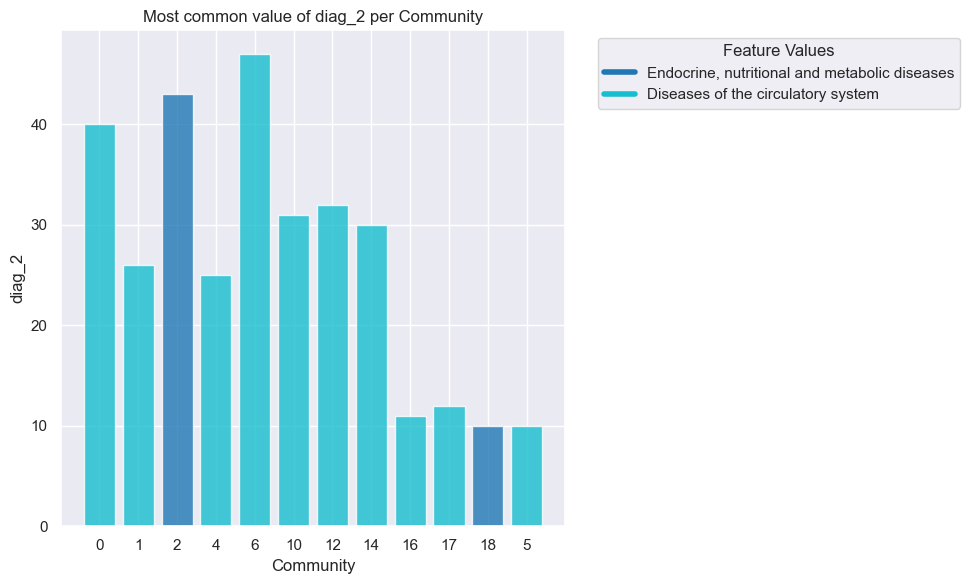

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


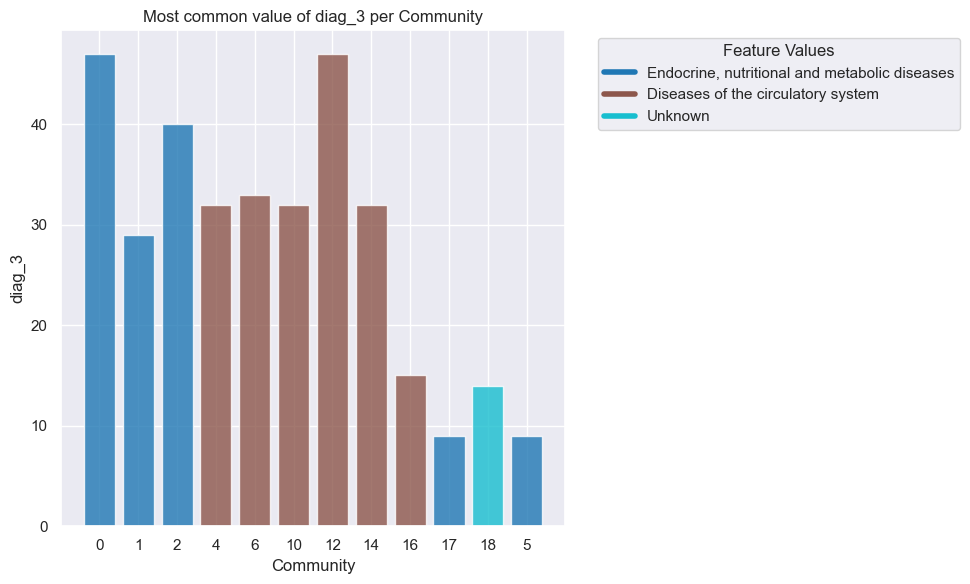

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


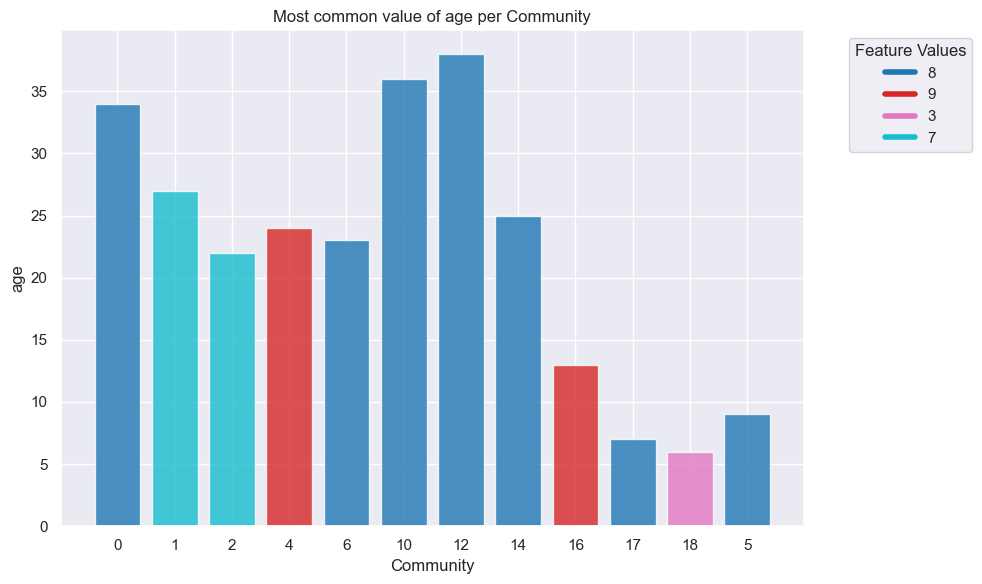

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


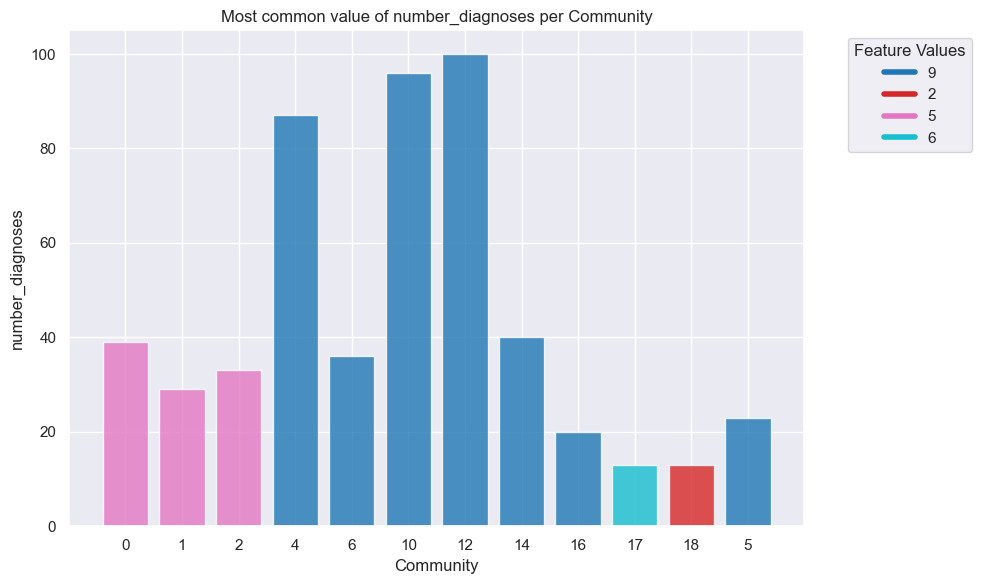

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


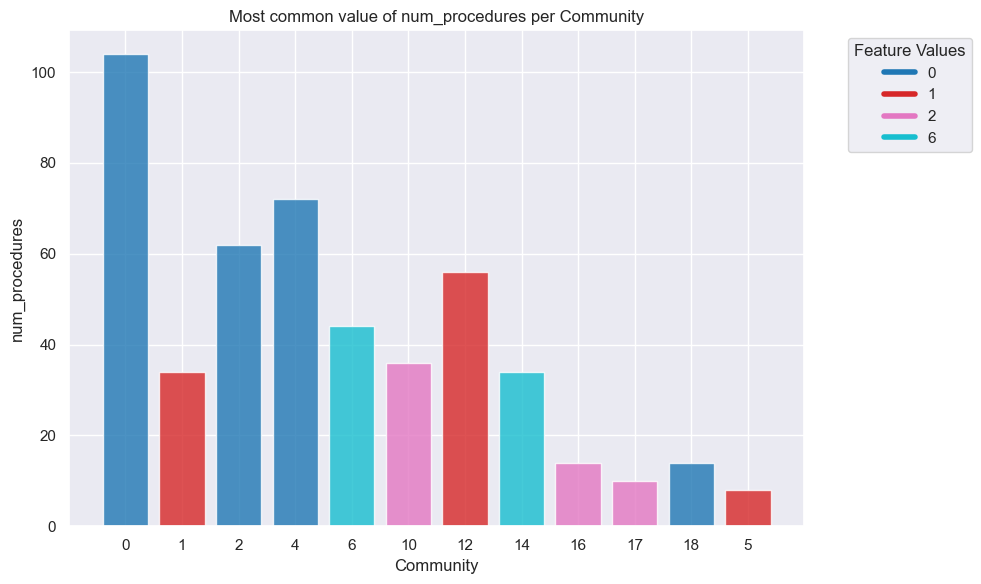

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


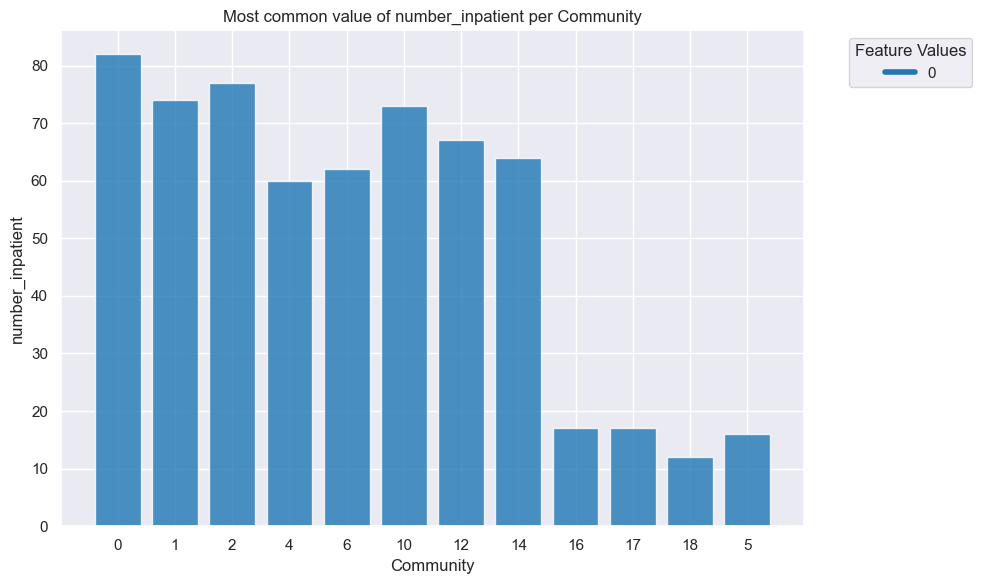

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


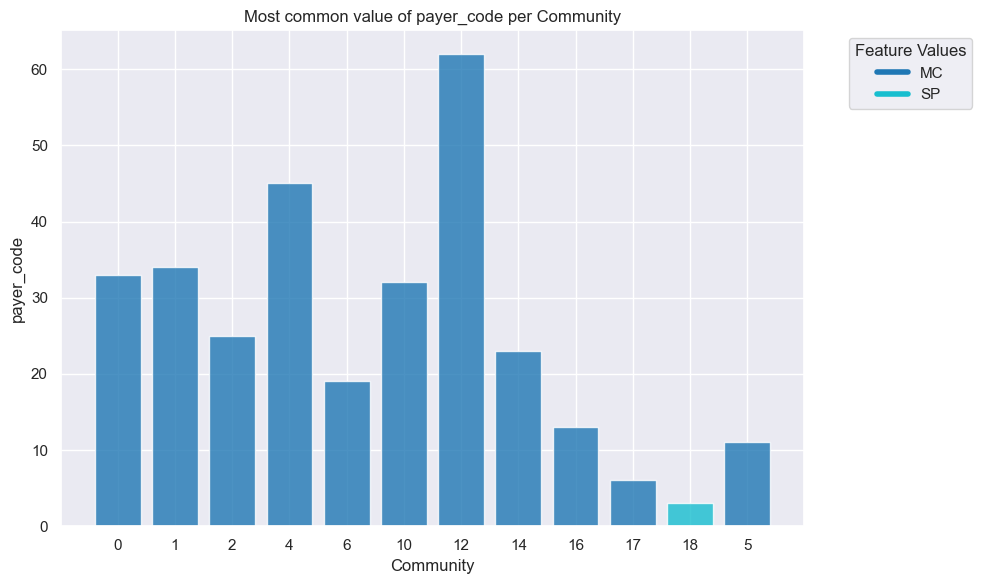

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


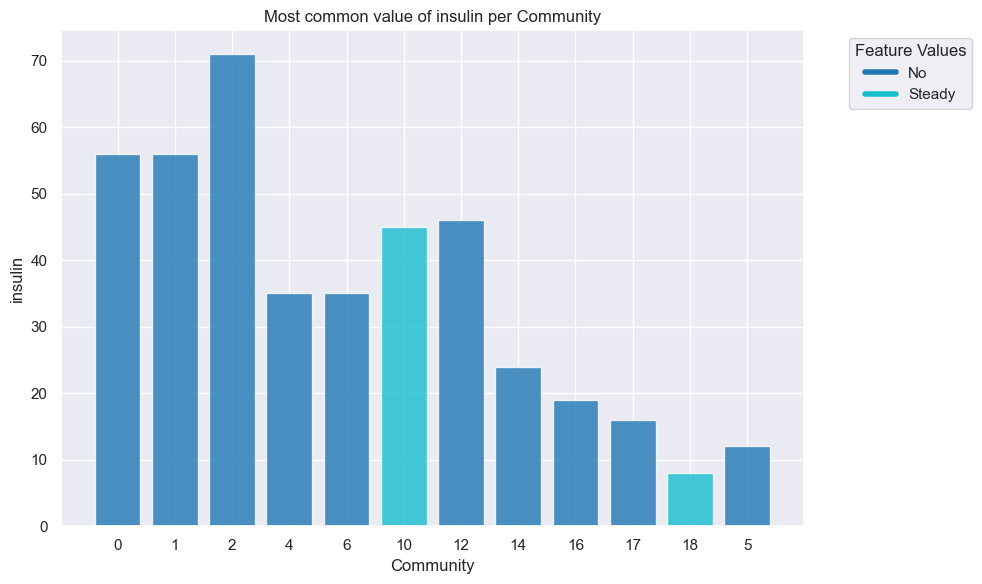

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


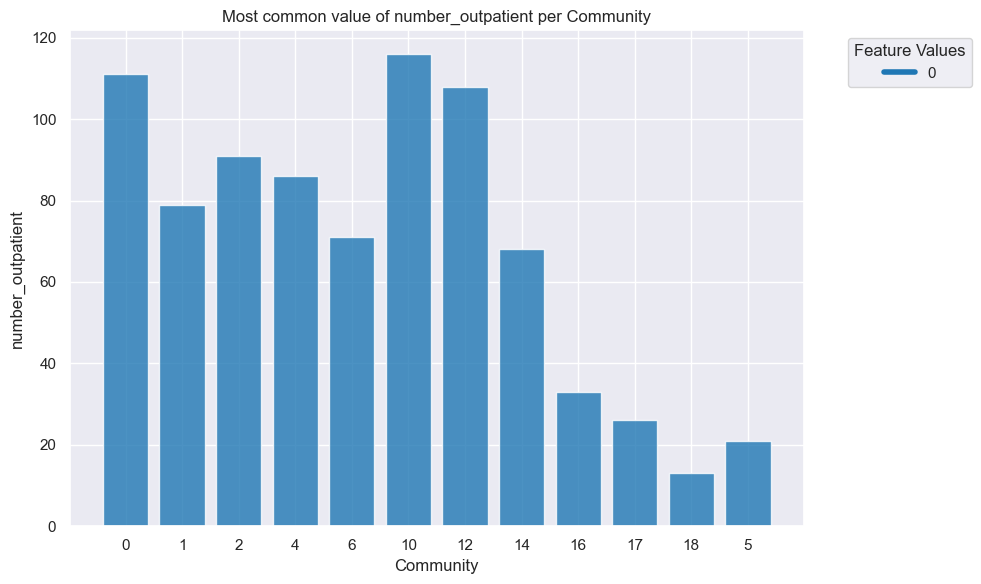

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


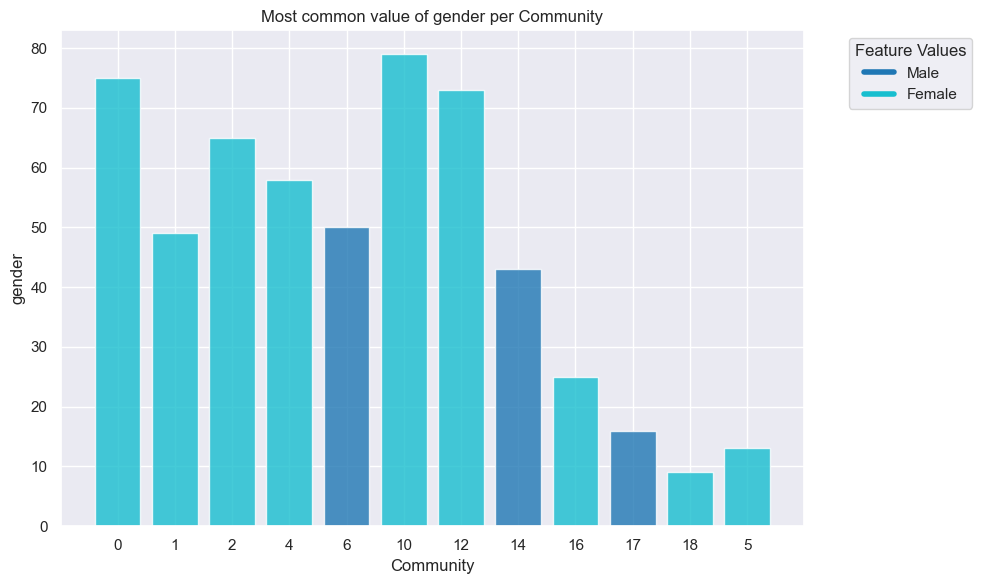

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3875079363.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_values))


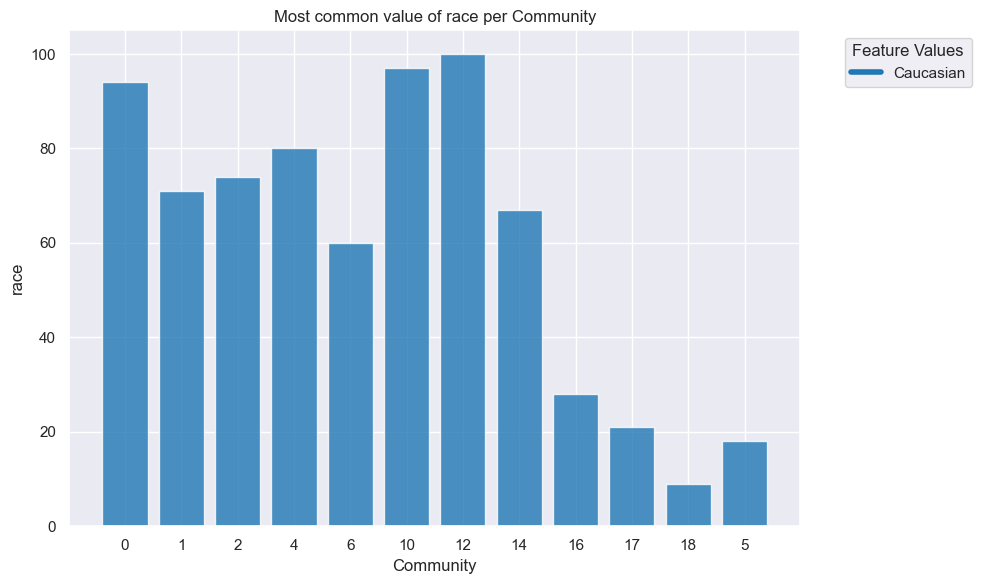

In [36]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Define the features to analyze
features = [
    'num_lab_procedures', 'num_medications', 'time_in_hospital', 'diag_1',
    'diag_2', 'diag_3', 'age', 'number_diagnoses', 'num_procedures',
    'number_inpatient', 'payer_code', 'insulin', 'number_outpatient',
    'gender', 'race'
]

# Filter communities to include only those found in both `skeewed_communitites` and `merged_df`
valid_communities = merged_df[
    merged_df['Community'].isin(skeewed_communitites['Community'])
]['Community'].unique()

# Generate bar plots for each feature
for feature in features:
    # Initialize a dictionary to store counts of the most frequent value for each community
    plot_data = {}
    annotations = {}
    
    for community in valid_communities:
        # Filter data for the current community and feature
        community_data = merged_df[merged_df['Community'] == community][feature]
        
        # Get the most frequent value and its count
        if not community_data.empty:
            most_frequent_value = community_data.value_counts().idxmax()
            most_frequent_count = community_data.value_counts().iloc[0]
        else:
            most_frequent_value = "No data"
            most_frequent_count = 0
        
        # Store the count and the value
        plot_data[str(community)] = most_frequent_count
        annotations[str(community)] = most_frequent_value
    
    # Get unique values of the feature and assign colors
    unique_values = list(set(annotations.values()))
    colormap = cm.get_cmap('tab10', len(unique_values))
    color_mapping = {value: mcolors.rgb2hex(colormap(i)) for i, value in enumerate(unique_values)}

    # Create a bar plot for the feature
    plt.figure(figsize=(10, 6))
    bar_colors = [color_mapping[annotations[community]] for community in plot_data.keys()]
    bars = plt.bar(plot_data.keys(), plot_data.values(), color=bar_colors, alpha=0.8)
    
    plt.title(f"Most common value of {feature} per Community")
    plt.xlabel("Community")
    plt.ylabel(f"{feature}")
    plt.xticks(ticks=list(plot_data.keys()), labels=list(plot_data.keys()))
    
    # Add a legend mapping unique values to colors
    handles = [plt.Line2D([0], [0], color=color, lw=4) for value, color in color_mapping.items()]
    labels = [f"{value}" for value in unique_values]
    plt.legend(handles, labels, title="Feature Values", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


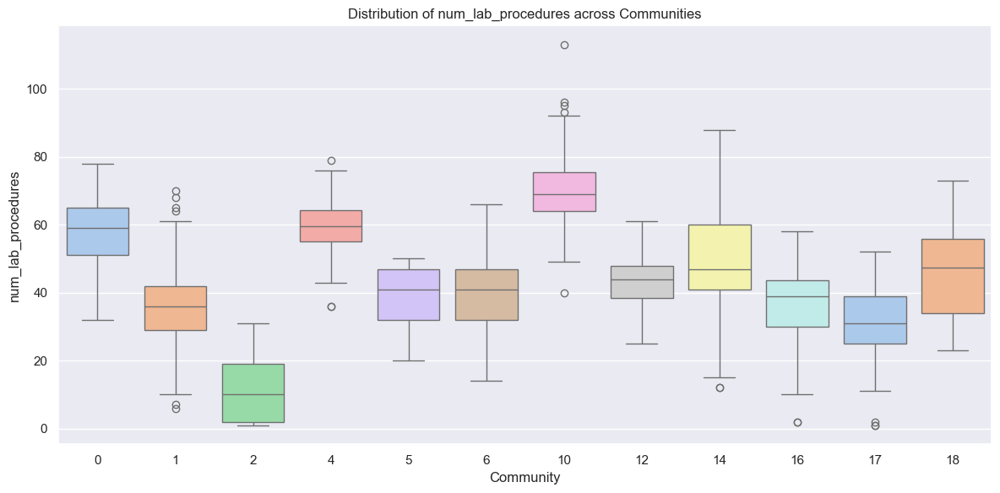

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


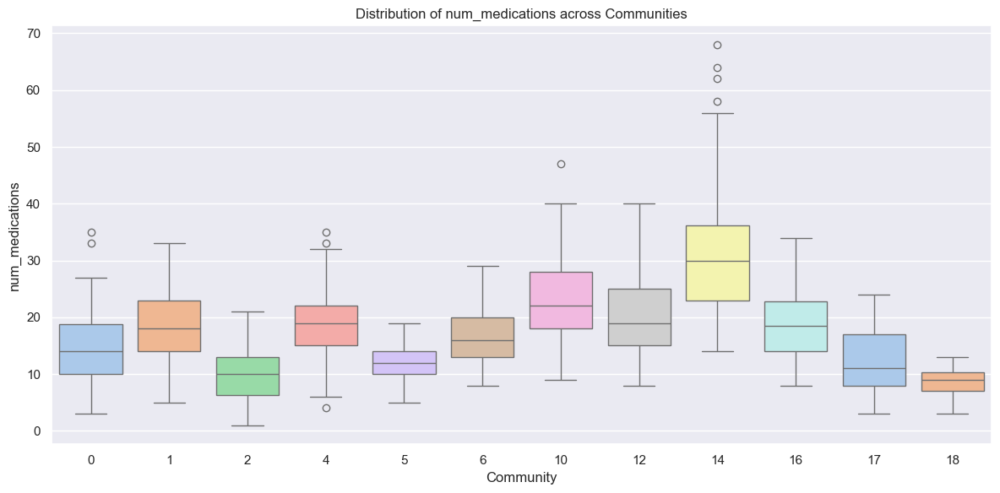

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


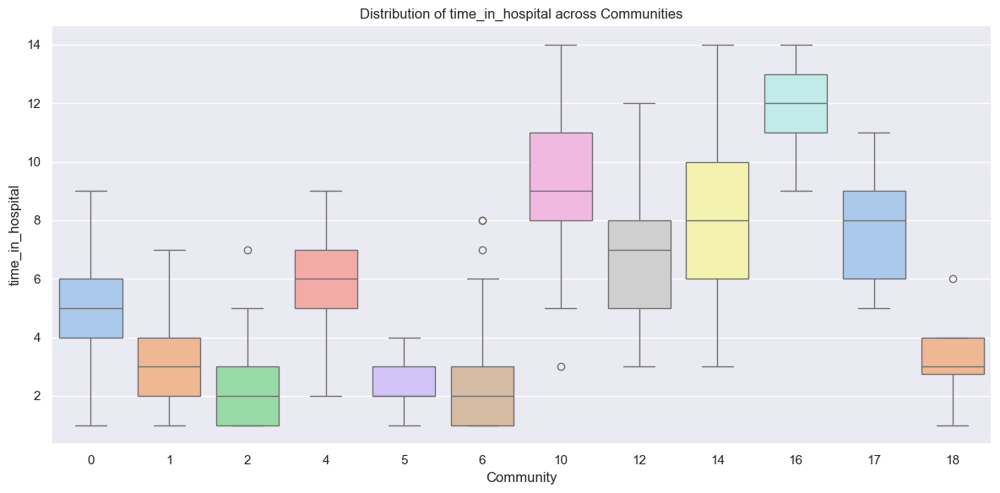

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


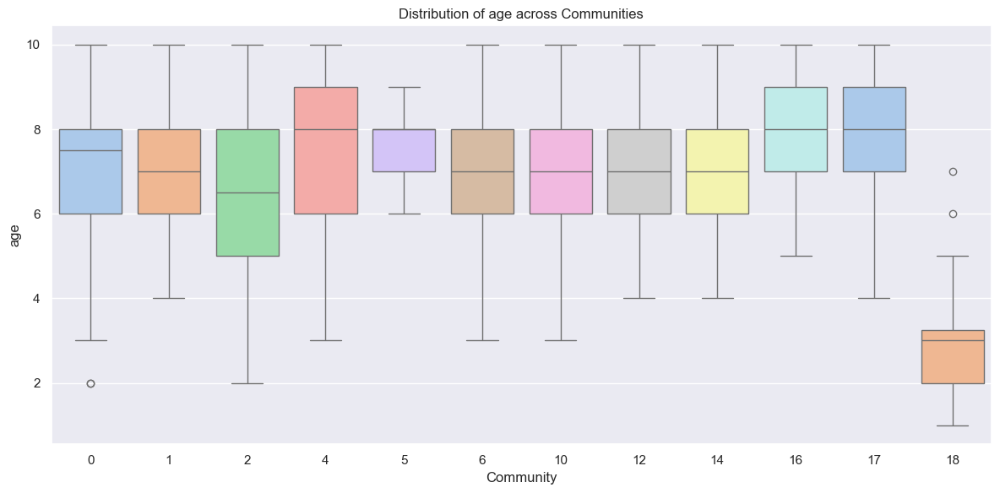

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


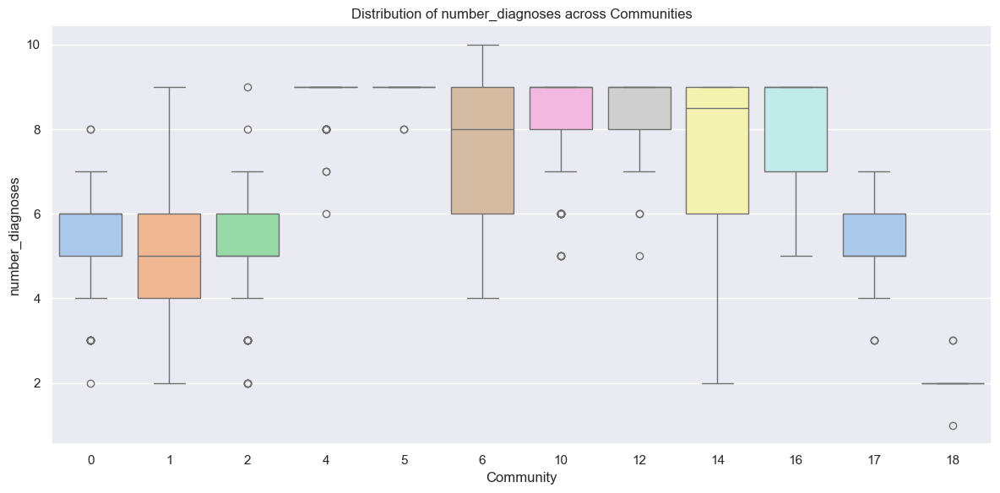

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


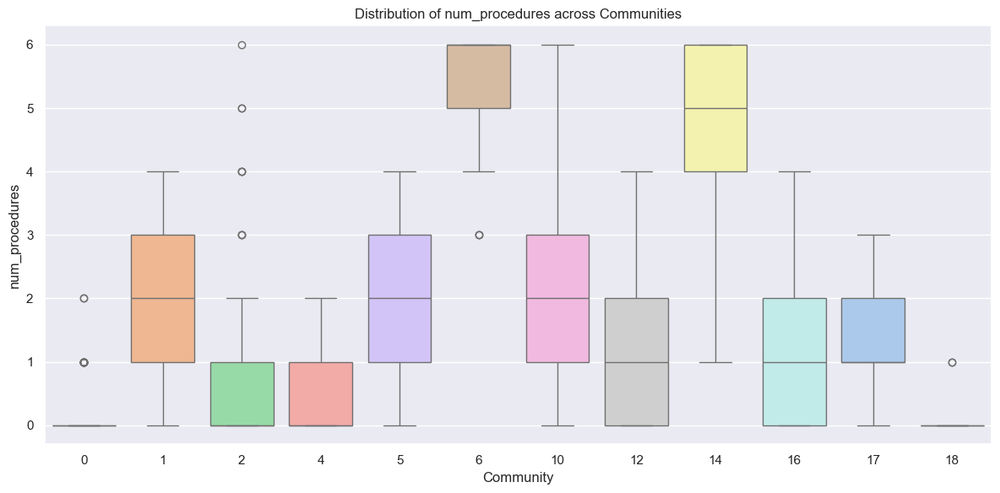

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


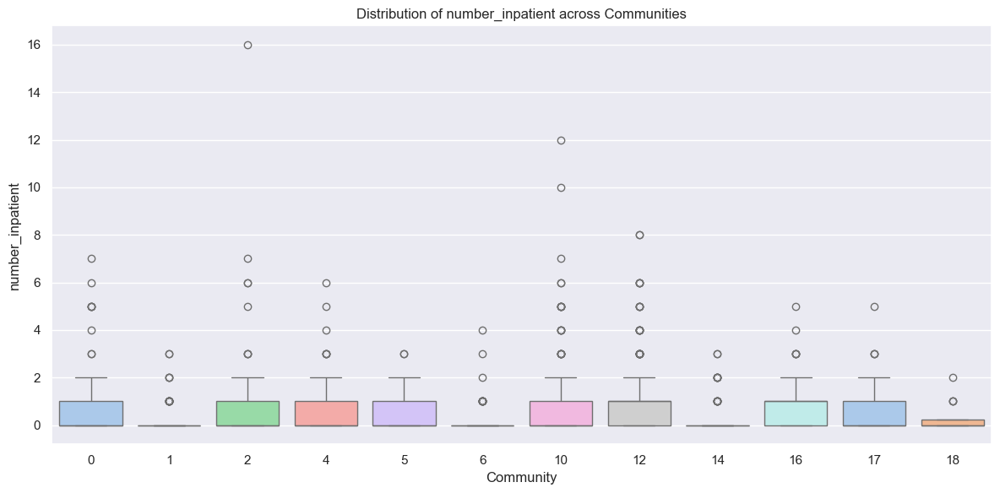

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\398538139.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')


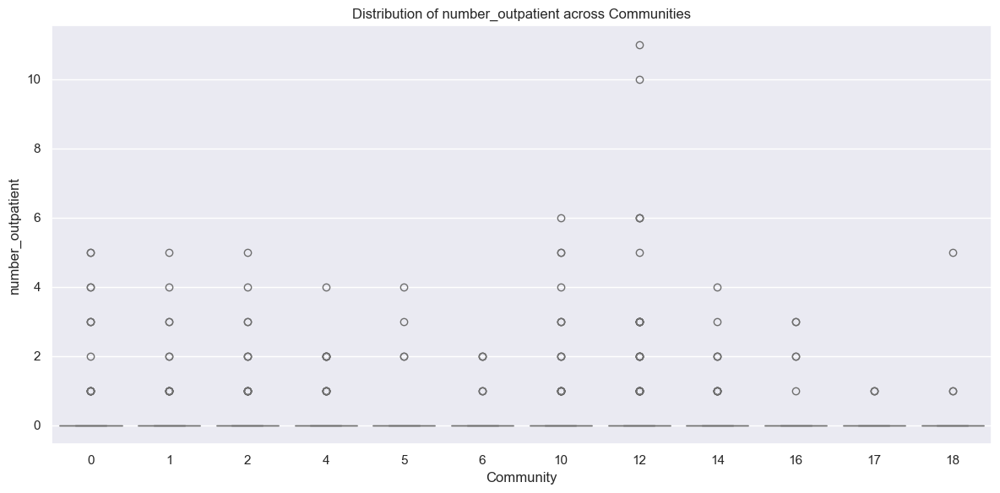

In [37]:
# Define the numerical features to analyze
numerical_features = [
    'num_lab_procedures', 'num_medications', 'time_in_hospital', 'age',
    'number_diagnoses', 'num_procedures', 'number_inpatient', 'number_outpatient'
]

# Filter communities to include only those found in both `skeewed_communitites` and `merged_df`
valid_data = merged_df[merged_df['Community'].isin(skeewed_communitites['Community'])]

# Generate boxplots for each numerical feature
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=valid_data, x='Community', y=feature, palette='pastel')
    plt.title(f"Distribution of {feature} across Communities")
    plt.xlabel("Community")
    plt.ylabel(feature)
    plt.xticks()
    plt.tight_layout()
    plt.show()


C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


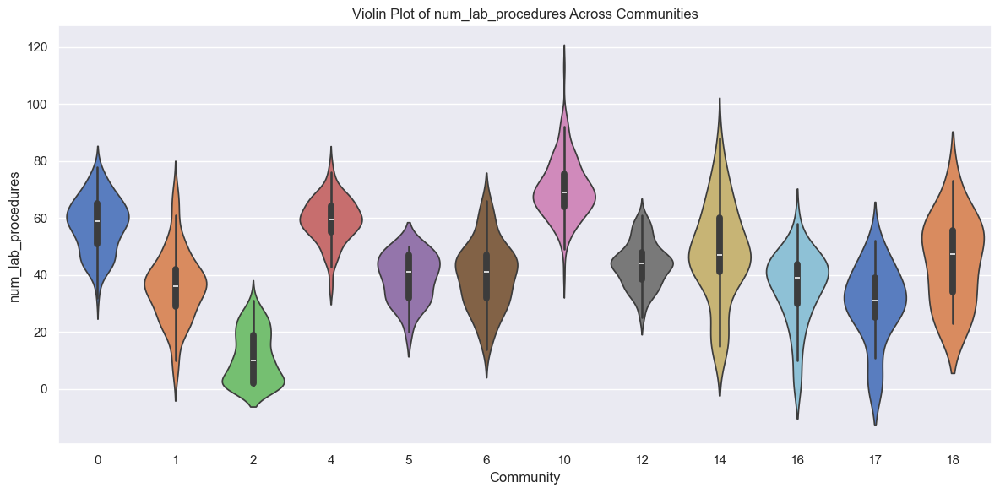

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


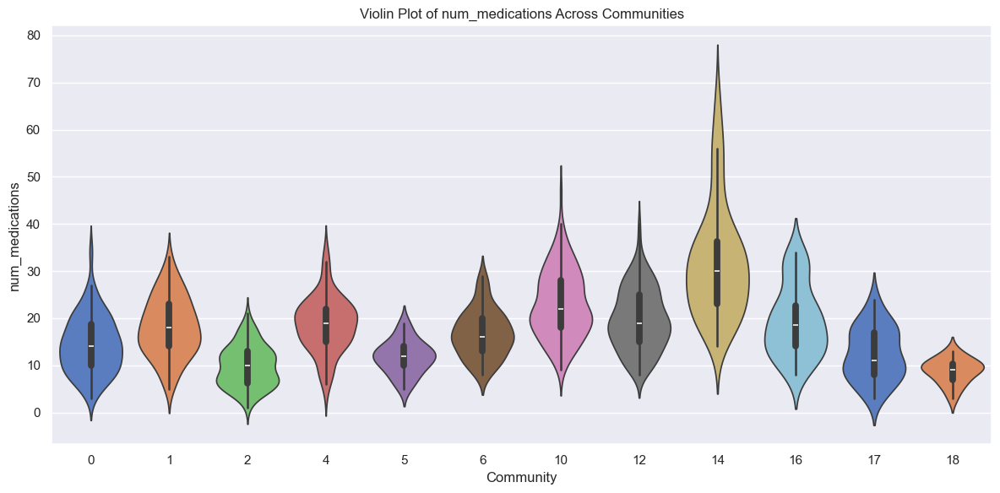

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


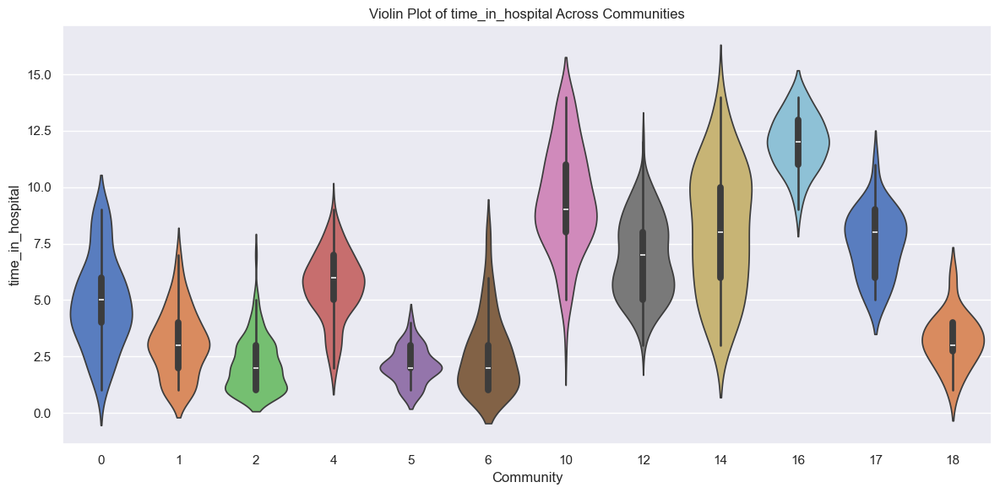

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


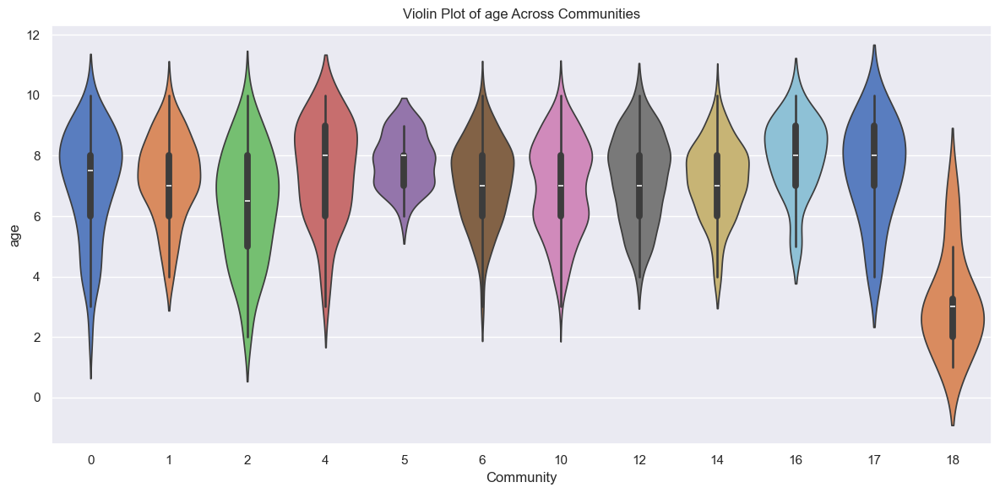

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


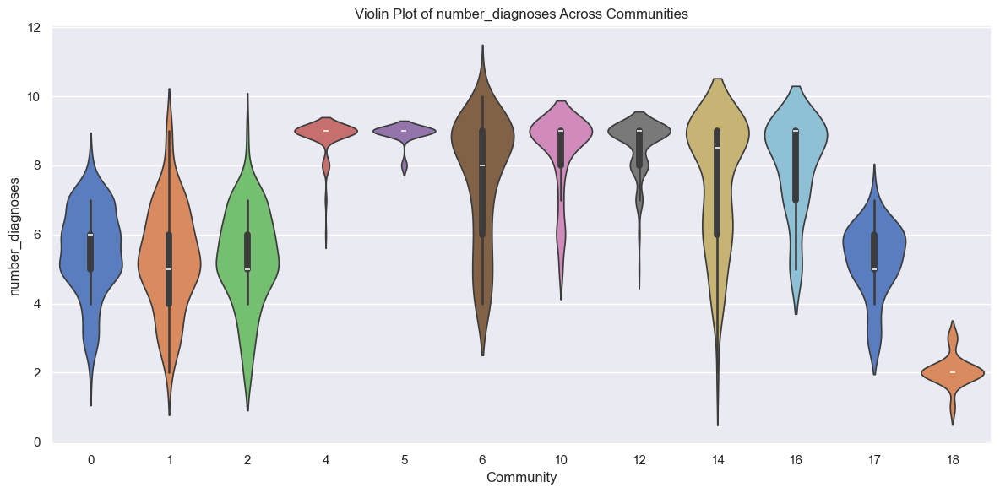

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


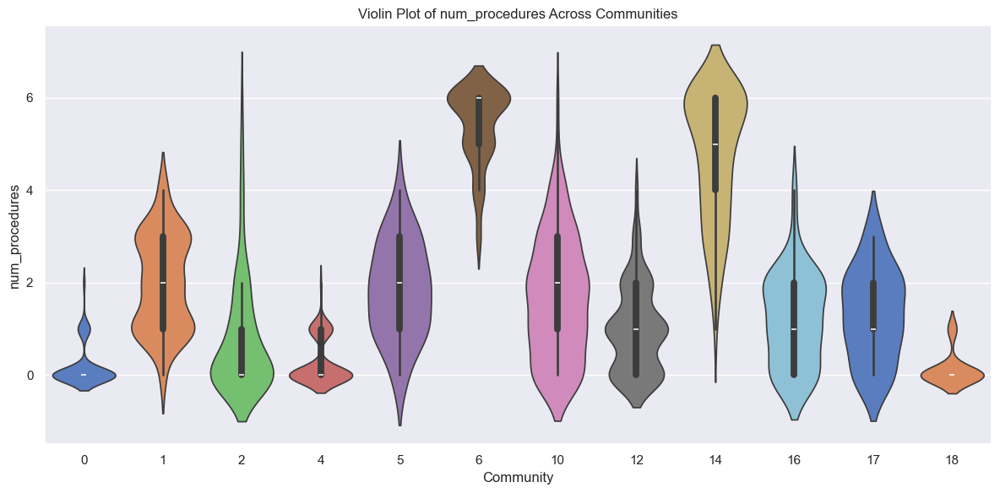

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


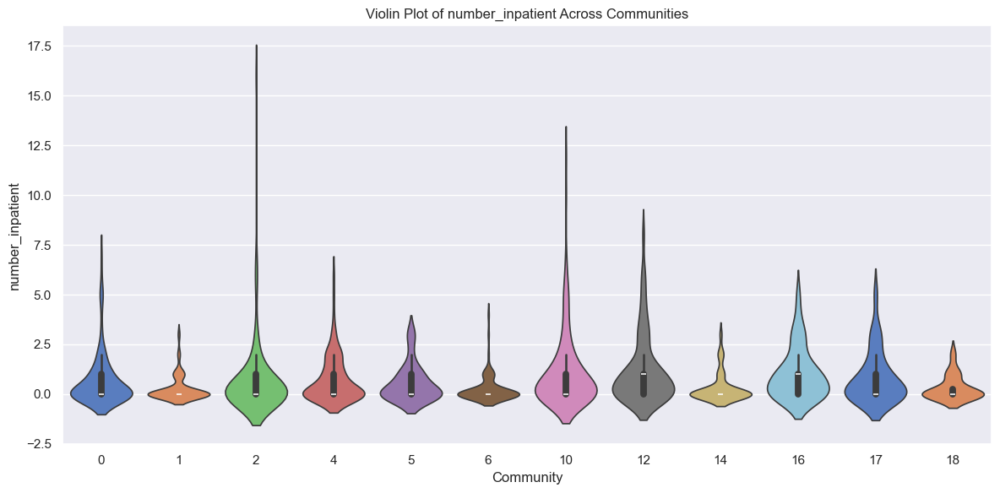

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
C:\Users\adria\AppData\Local\Temp\ipykernel_6392\3319692163.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')


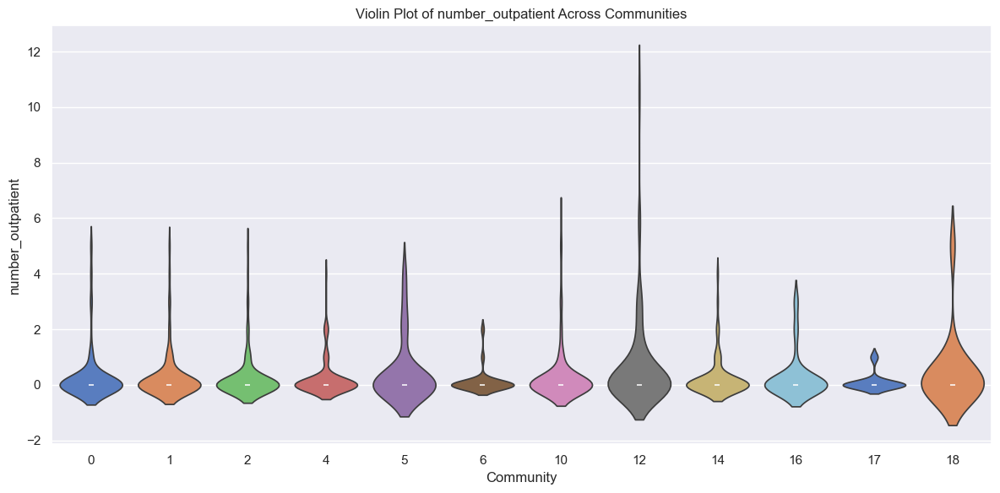

In [38]:
for feature in numerical_features:
    plt.figure(figsize=(12, 6))
    sns.violinplot(data=valid_data, x='Community', y=feature, palette='muted', scale='width')
    plt.title(f"Violin Plot of {feature} Across Communities")
    plt.xlabel("Community")
    plt.ylabel(feature)
    plt.xticks()
    plt.tight_layout()
    plt.show()


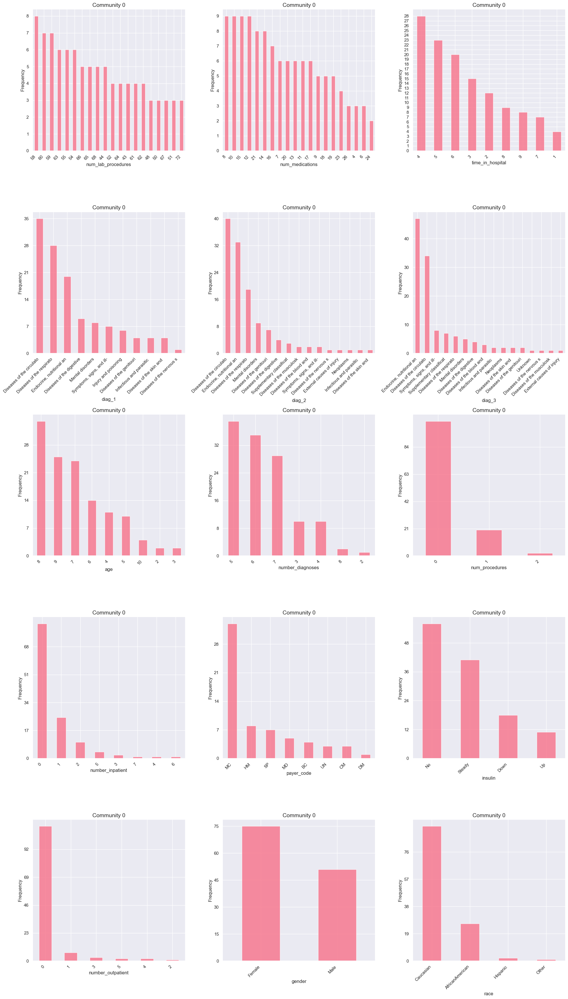

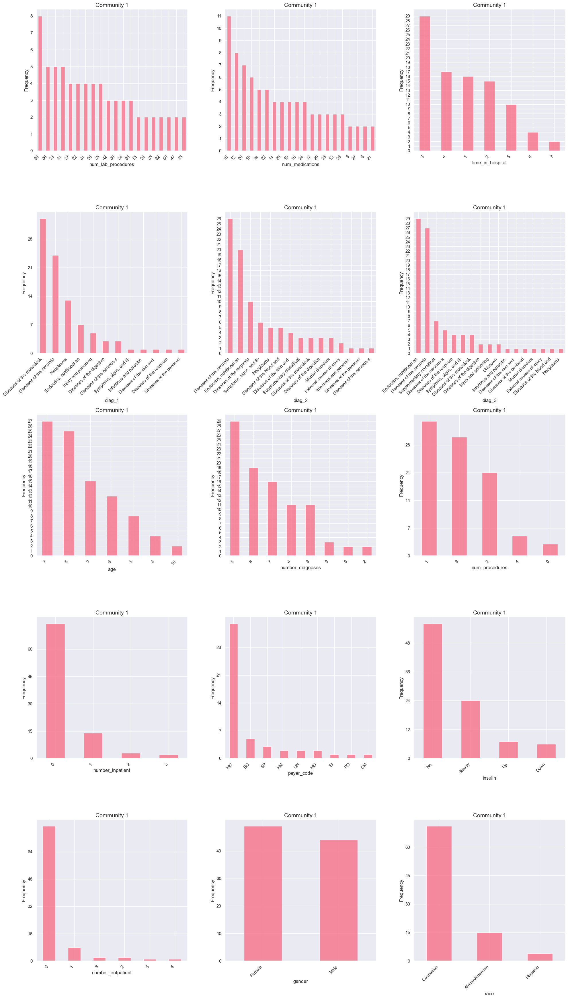

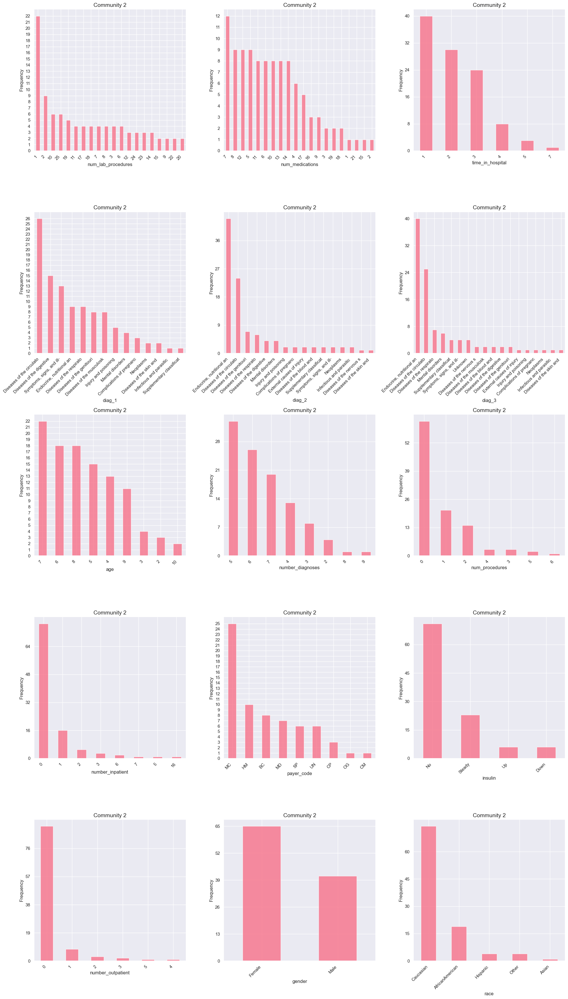

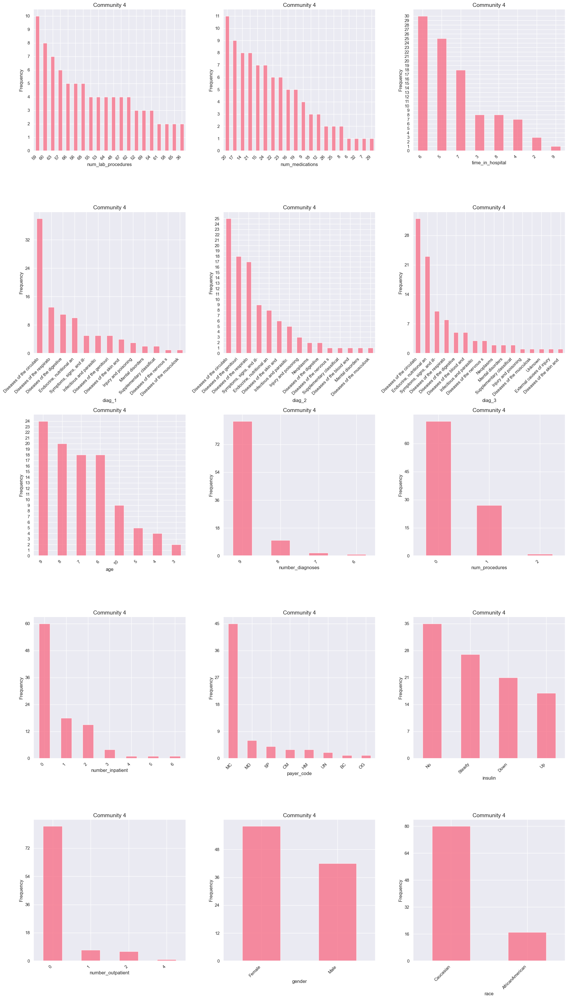

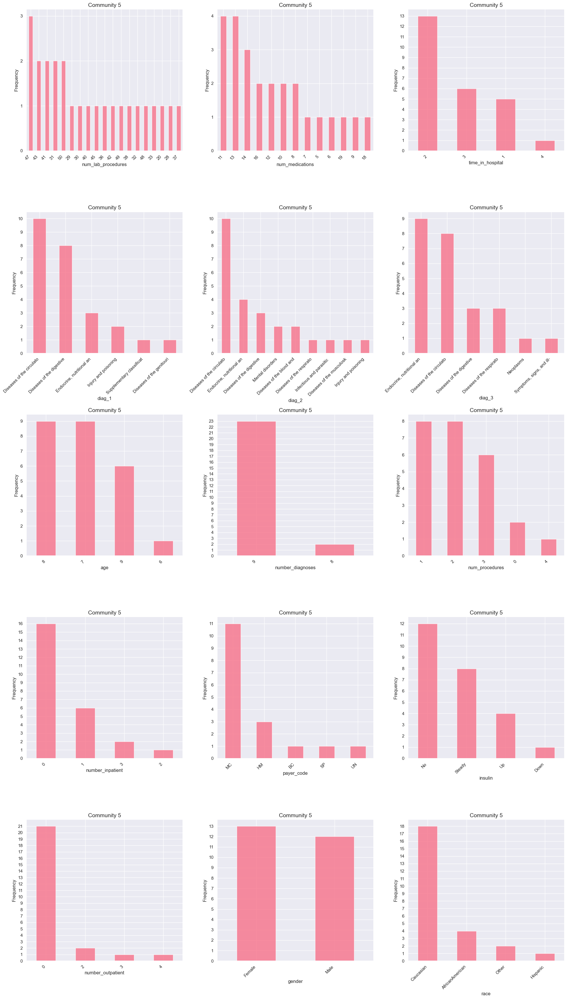

...

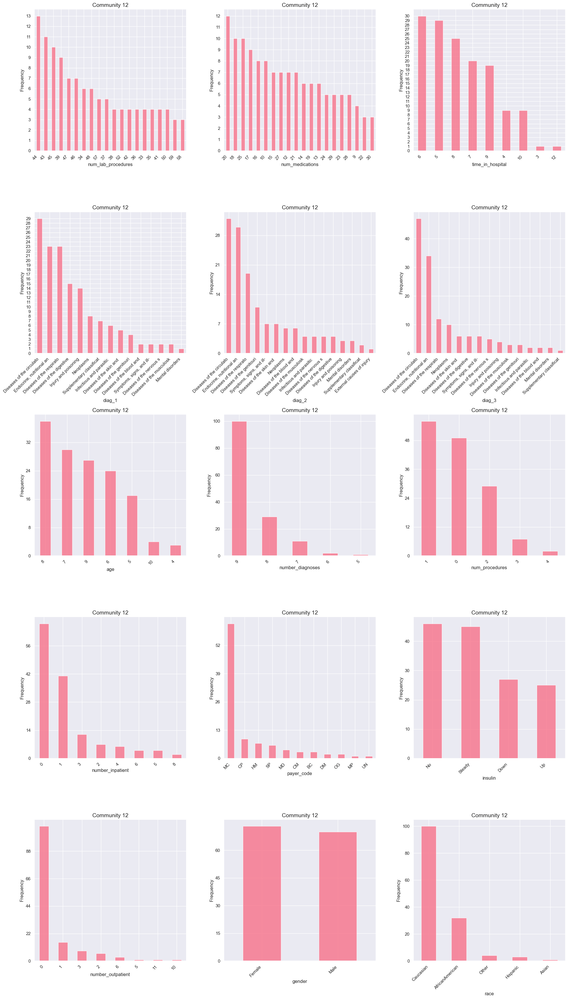

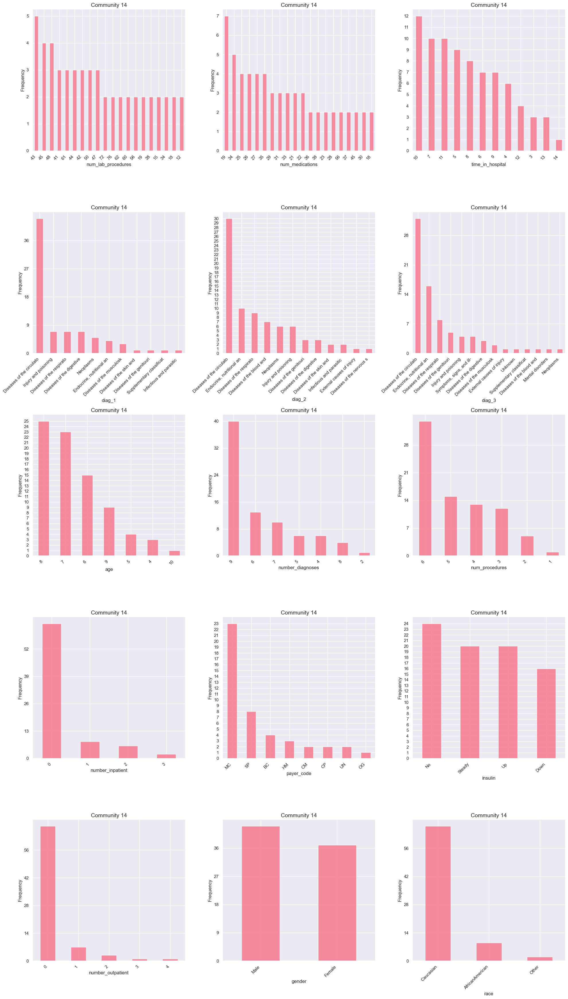

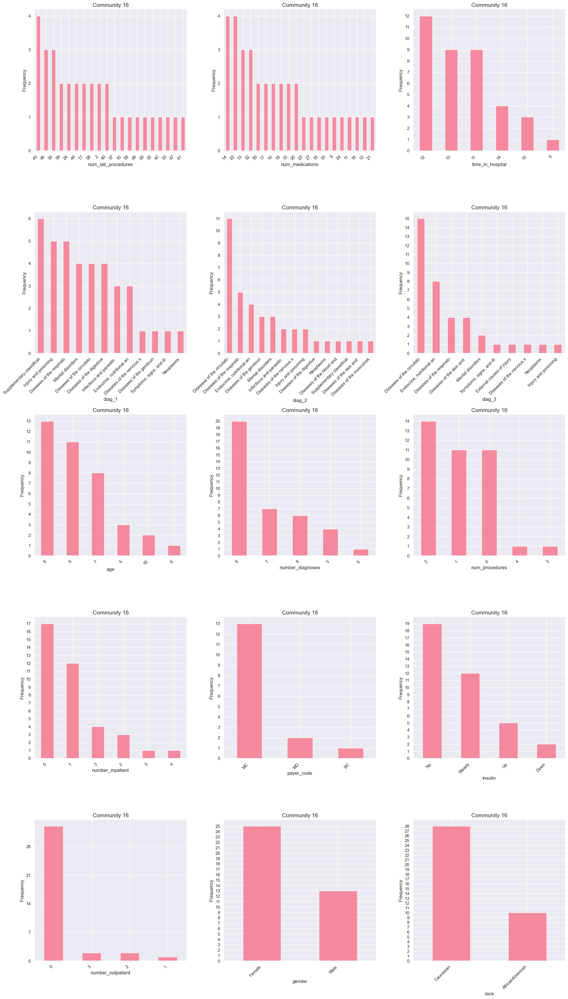

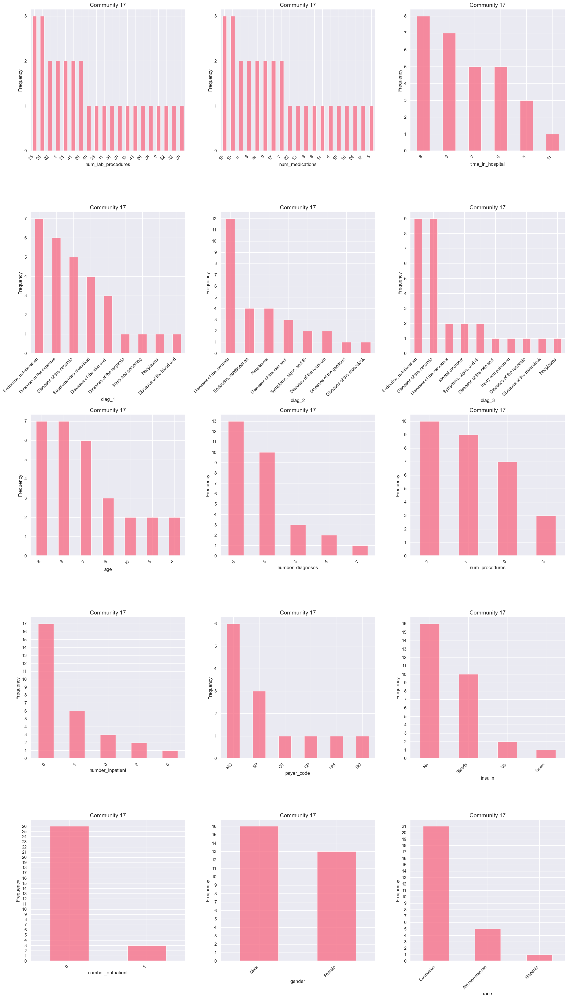

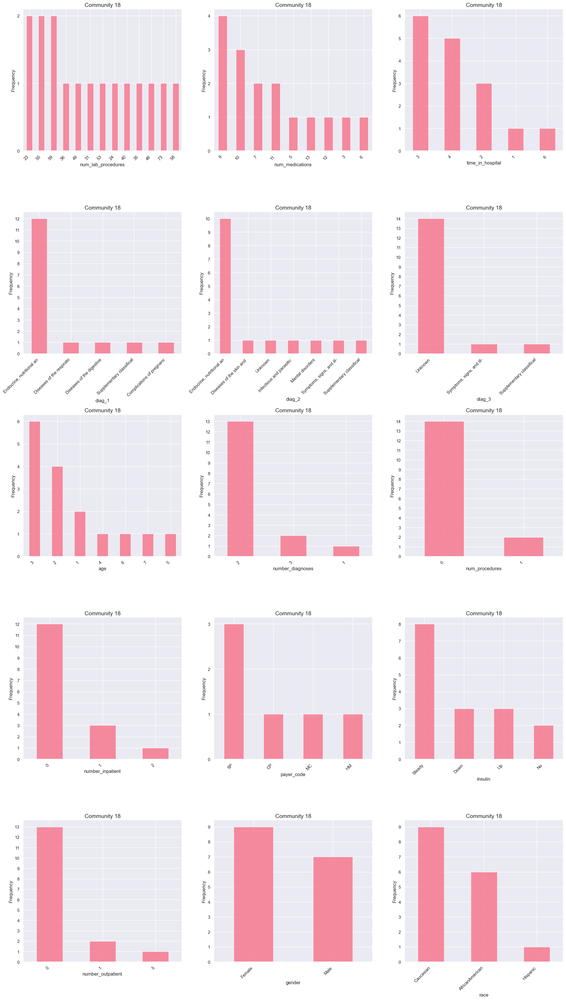

In [39]:
import math
import matplotlib.pyplot as plt

# Iterate over communities and important features
for com in skeewed_communitites['Community']:
    fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(20, 35))

    # Flatten the axes for easier indexing
    axs = axs.flatten()
    # Counter to keep track of the current plot
    plot_index = 0

    for col in important_features:
        # Check if we have enough subplots
        if plot_index >= len(axs):
            break

        # Select the current axis
        ax = axs[plot_index]

        # Filter data and get the top 20 most frequent x-ticks
        data = reduced_labels[reduced_labels['Community'] == com][col[0]].value_counts()
        data = data[:20]  # Limit to top 20

        # Plot the data
        data.plot(kind='bar', alpha=0.8, ax=ax)

        # Determine the maximum value for y-axis
        maximum_ele = max(data)
        if maximum_ele > 30:  # Adjust tick spacing dynamically
            step = max(1, math.ceil(maximum_ele / 5))  # Divide into 10 steps
        else:
            step = 1
        yticks = range(0, math.ceil(maximum_ele) + 1, step)
        ax.set_yticks(yticks)  # Set y-ticks dynamically based on step size

        # Set title and labels
        ax.set_title(f"Community {com}", fontsize=14)
        ax.set_xlabel(col[0], fontsize=12)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.tick_params(axis='x', rotation=45)
        for tick in ax.get_xticklabels():  # Align the labels to the right
            tick.set_ha('right')

        # Move to the next subplot
        plot_index += 1

    # Adjust layout and hide unused subplots
    for ax in axs[plot_index:]:
        ax.set_visible(False)  # Hide unused subplots

    plt.tight_layout()
    plt.show()

In [40]:
# Iterate over communities and important features
for com in skeewed_communitites['Community']:
    print(f"Community {com}:")
    for col in important_features:
        # Filter data for the current community and column
        data = reduced_labels[reduced_labels['Community'] == com][col[0]]
        
        # Find the most frequent value
        if not data.empty:
            most_frequent_value = data.value_counts().idxmax()
            print(f" - '{col[0]}': '{most_frequent_value}'")
        else:
            print(f" - Column '{col[0]}': No data available")
    print()  # Blank line for better separation between communities


Community 0:
 - 'num_lab_procedures': '58'
 - 'num_medications': '8'
 - 'time_in_hospital': '4'
 - 'diag_1': 'Diseases of the circulato'
 - 'diag_2': 'Diseases of the circulato'
 - 'diag_3': 'Endocrine, nutritional an'
 - 'age': '8'
 - 'number_diagnoses': '5'
 - 'num_procedures': '0'
 - 'number_inpatient': '0'
 - 'payer_code': 'MC'
 - 'insulin': 'No'
 - 'number_outpatient': '0'
 - 'gender': 'Female'
 - 'race': 'Caucasian'

Community 1:
 - 'num_lab_procedures': '39'
 - 'num_medications': '15'
 - 'time_in_hospital': '3'
 - 'diag_1': 'Diseases of the musculosk'
 - 'diag_2': 'Diseases of the circulato'
 - 'diag_3': 'Endocrine, nutritional an'
 - 'age': '7'
 - 'number_diagnoses': '5'
 - 'num_procedures': '1'
 - 'number_inpatient': '0'
 - 'payer_code': 'MC'
 - 'insulin': 'No'
 - 'number_outpatient': '0'
 - 'gender': 'Female'
 - 'race': 'Caucasian'

Community 2:
 - 'num_lab_procedures': '1'
 - 'num_medications': '7'
 - 'time_in_hospital': '1'
 - 'diag_1': 'Diseases of the circulato'
 - 'diag_

In [41]:
# Create a list to store results
results = {}

# Iterate over communities and important features
for com in skeewed_communitites['Community']:
    community_data = {}
    for col in important_features:
        # Filter data for the current community and column
        data = merged_df[merged_df['Community'] == com][col[0]]
        
        # Find the most frequent value
        most_frequent_value = data.value_counts().idxmax() if not data.empty else "No data available"
        
        # Add to community data
        community_data[col[0]] = most_frequent_value
    
    # Add the community data to results
    results[com] = community_data

# Convert results to a DataFrame
results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.index.name = 'Community'
results_df.reset_index(inplace=True)

# Display the DataFrame in the Jupyter notebook
from IPython.display import display
display(results_df)

,Community,num_lab_procedures,num_medications,time_in_hospital,diag_1,diag_2,diag_3,age,number_diagnoses,num_procedures,number_inpatient,payer_code,insulin,number_outpatient,gender,race
0,0,58,8,4,Diseases of the circulatory system,Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases",8,5,0,0,MC,No,0,Female,Caucasian
1,1,39,15,3,Diseases of the musculoskeletal system and con...,Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases",7,5,1,0,MC,No,0,Female,Caucasian
2,2,1,7,1,Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases","Endocrine, nutritional and metabolic diseases",7,5,0,0,MC,No,0,Female,Caucasian
3,4,59,20,6,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,9,9,0,0,MC,No,0,Female,Caucasian
4,5,47,11,2,Diseases of the circulatory system,Diseases of the circulatory system,"Endocrine, nutritional and metabolic diseases",8,9,1,0,MC,No,0,Female,Caucasian
5,6,46,15,1,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,8,9,6,0,MC,No,0,Male,Caucasian
6,10,65,20,9,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,8,9,2,0,MC,Steady,0,Female,Caucasian
7,12,44,20,6,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,8,9,1,0,MC,No,0,Female,Caucasian
8,14,43,19,10,Diseases of the circulatory system,Diseases of the circulatory system,Diseases of the circulatory system,8,9,6,0,MC,No,0,Male,Caucasian
9,16,43,14,12,Supplementary classification (V codes),Diseases of the circulatory system,Diseases of the circulatory system,9,9,2,0,MC,No,0,Female,Caucasian


# Community-Awareness Features from Louvain

Community labels from the Louvain algorithm were treated
as categorical features, and three community-based metrics
such as Normalized Within-Module Degree, Participation Co-
efficient, and Community Association Strength, were added
to the initial RF pipeline

In [42]:
import numpy as np
import networkx as nx
from community import community_louvain
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import csr_matrix
from sklearn.preprocessing import normalize

# Step 2: Compute community-aware features
def compute_community_features(G, partition):
    """
    Compute community-aware features for nodes in a graph.

    Args:
        G (networkx.Graph): Graph.
        partition (dict): Louvain community partition mapping.

    Returns:
        dict: Community-aware features for each node.
    """
    features = {}
    community_to_nodes = {}
    
    # Group nodes by community
    for node, community in partition.items():
        community_to_nodes.setdefault(community, []).append(node)

    for node in G.nodes:
        community = partition[node]
        community_nodes = community_to_nodes[community]
        community_size = len(community_nodes)

        # Within-module degree
        within_community_neighbors = [nbr for nbr in G.neighbors(node) if partition[nbr] == community]
        within_community_degree = len(within_community_neighbors)

        # Debugging output for within-module degree
        print(f"Node {node} - Community: {community}, Within-community degree: {within_community_degree}, Community size: {community_size}")

        # Normalized within-module degree
        normalized_within_module_degree = within_community_degree / max(community_size - 1, 1)  # Avoid division by zero

        # Participation coefficient
        total_degree = len(list(G.neighbors(node)))
        community_contributions = [
            (len([nbr for nbr in G.neighbors(node) if partition[nbr] == comm]) / total_degree) ** 2
            for comm in community_to_nodes
        ]
        participation_coefficient = 1 - sum(community_contributions)

        # Debugging output for participation coefficient
        print(f"Node {node} - Total degree: {total_degree}, Participation coefficient: {participation_coefficient}")

        # Community association strength
        community_strength = sum(1 for nbr in G.neighbors(node) if partition[nbr] == community)
        community_association_strength = community_strength / total_degree if total_degree > 0 else 0

        # Debugging output for community association strength
        print(f"Node {node} - Community strength: {community_strength}, Community association strength: {community_association_strength}")

        features[node] = {
            "normalized_within_module_degree": normalized_within_module_degree,
            "participation_coefficient": participation_coefficient,
            "community_association_strength": community_association_strength,
        }
    
    return features


# Step 1: Align community features with the original dataset
num_samples = X_selected.shape[0]
default_community_features = [0, 0, 0]  # Default values for missing nodes
community_feature_matrix_aligned = np.zeros((num_samples, 3))  # 3 community-aware features

# Assuming G is the graph and partition contains community assignments
community_features = compute_community_features(G, partition)

# Align the community features with the original dataset
for i, node in enumerate(G.nodes):
    if node < num_samples:  # Ensure that node indices match the data
        community_feature_matrix_aligned[node, :] = [
            community_features[node]["normalized_within_module_degree"],
            community_features[node]["participation_coefficient"],
            community_features[node]["community_association_strength"],
        ]
    else:
        community_feature_matrix_aligned[i, :] = default_community_features  # Use default if node is missing

# Step 2: Integrate community features with existing features
X_with_community_features = np.hstack([X_selected, community_feature_matrix_aligned])

# Print a summary
print(f"Community features shape (aligned): {community_feature_matrix_aligned.shape}")
print(f"Final feature set shape: {X_with_community_features.shape}")


Node 0 - Community: 0, Within-community degree: 5, Community size: 126
Node 0 - Total degree: 5, Participation coefficient: 0.0
Node 0 - Community strength: 5, Community association strength: 1.0
Node 1 - Community: 1, Within-community degree: 4, Community size: 93
Node 1 - Total degree: 4, Participation coefficient: 0.0
Node 1 - Community strength: 4, Community association strength: 1.0
Node 2 - Community: 2, Within-community degree: 5, Community size: 106
Node 2 - Total degree: 5, Participation coefficient: 0.0
Node 2 - Community strength: 5, Community association strength: 1.0
Node 3 - Community: 3, Within-community degree: 8, Community size: 113
Node 3 - Total degree: 8, Participation coefficient: 0.0
Node 3 - Community strength: 8, Community association strength: 1.0
Node 4 - Community: 4, Within-community degree: 1, Community size: 100
Node 4 - Total degree: 5, Participation coefficient: 0.31999999999999984
Node 4 - Community strength: 1, Community association strength: 0.2
Node 

# Spectral Clustering

In [43]:
# Create a graph from the similarity matrix
G = nx.from_numpy_array(similarity_matrix)

# Perform Spectral Clustering
n_clusters = 5  # Set the number of clusters you want
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=42)
spectral_labels = spectral_clustering.fit_predict(similarity_matrix)

# Assign community labels
node_community_map = {i: spectral_labels[i] for i in range(len(spectral_labels))}

# Create node data DataFrame
node_data = pd.DataFrame({
    "Node": range(len(spectral_labels)),
    "Community": spectral_labels,
    "Readmitted": df['readmitted'].iloc[:len(spectral_labels)].values
})

# Calculate modularity
modularity = nx.algorithms.community.modularity(G, [
    [node for node in node_community_map if node_community_map[node] == community]
    for community in set(spectral_labels)
])

print(f"Modularity: {modularity}")

d:\DTU\AI\Q3\CompTools_DS\Project\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\DTU\AI\Q3\CompTools_DS\Project\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


Modularity: 0.5957230127647958


In [44]:
# Group nodes by community
grouped = node_data.groupby("Community")

# Analyze the distribution of `readmitted` in each community
readmitted_distribution = grouped["Readmitted"].value_counts(normalize=True).unstack(fill_value=0)

print("Distribution of 'readmitted' in each community:")
print(readmitted_distribution)


Distribution of 'readmitted' in each community:
Readmitted         0         1         2
Community                               
0           0.396040  0.297030  0.306931
1           0.413953  0.316279  0.269767
2           0.274910  0.358944  0.366146
3           0.354305  0.314570  0.331126
4           0.395833  0.322917  0.281250


In [45]:
from scipy.stats import entropy

def compute_entropy(distribution):
    """Compute entropy for a given class distribution."""
    return entropy(distribution, base=2)

# Calculate entropy for each community
community_entropies = readmitted_distribution.apply(compute_entropy, axis=1)
print("\nCommunity Entropies (Lower values indicate higher homogeneity):")
print(community_entropies)



Community Entropies (Lower values indicate higher homogeneity):
Community
0    1.572430
1    1.561911
2    1.573461
3    1.583243
4    1.570553
dtype: float64


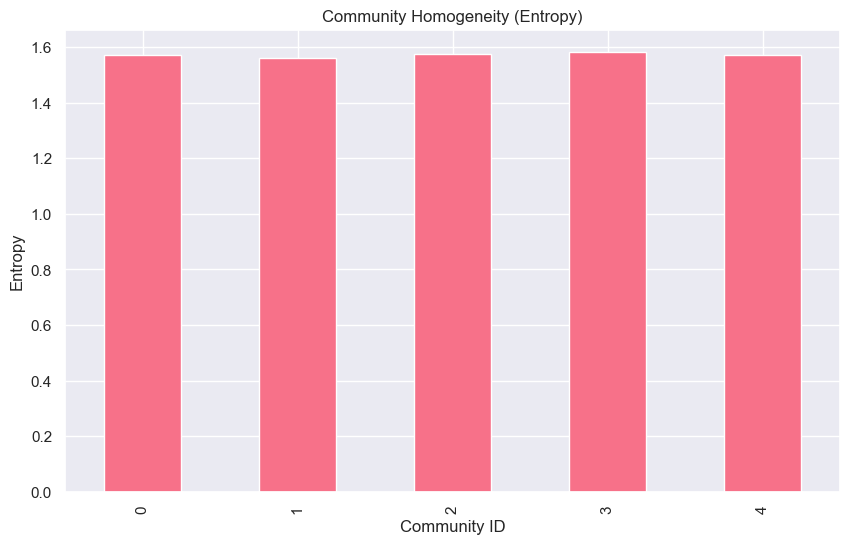

In [46]:
import matplotlib.pyplot as plt

# Visualize entropy
community_entropies.plot(kind='bar', figsize=(10, 6), title="Community Homogeneity (Entropy)")
plt.ylabel("Entropy")
plt.xlabel("Community ID")
plt.show()


In [47]:
# Create a contingency table with 'readmitted' values across communities
contingency_table = readmitted_distribution.fillna(0)

print("\nContingency Table:")
print(contingency_table)

# Perform Chi-Square test to see if there's a significant association
chi2_stat, p_val, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Square Test Results:")
print(f"Chi2 Statistic: {chi2_stat}")
print(f"P-Value: {p_val}")

# Check if the p-value is below the significance level (e.g., 0.05)
if p_val < 0.05:
    print("\nThe distribution of 'readmitted' values is significantly different across communities.")
else:
    print("\nThe distribution of 'readmitted' values is not significantly different across communities.")


Contingency Table:
Readmitted         0         1         2
Community                               
0           0.396040  0.297030  0.306931
1           0.413953  0.316279  0.269767
2           0.274910  0.358944  0.366146
3           0.354305  0.314570  0.331126
4           0.395833  0.322917  0.281250

Chi-Square Test Results:
Chi2 Statistic: 0.06001212743206015
P-Value: 0.999999967023473

The distribution of 'readmitted' values is not significantly different across communities.


# Figures

C:\Users\adria\AppData\Local\Temp\ipykernel_6392\2222791929.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab10', len(unique_communities))


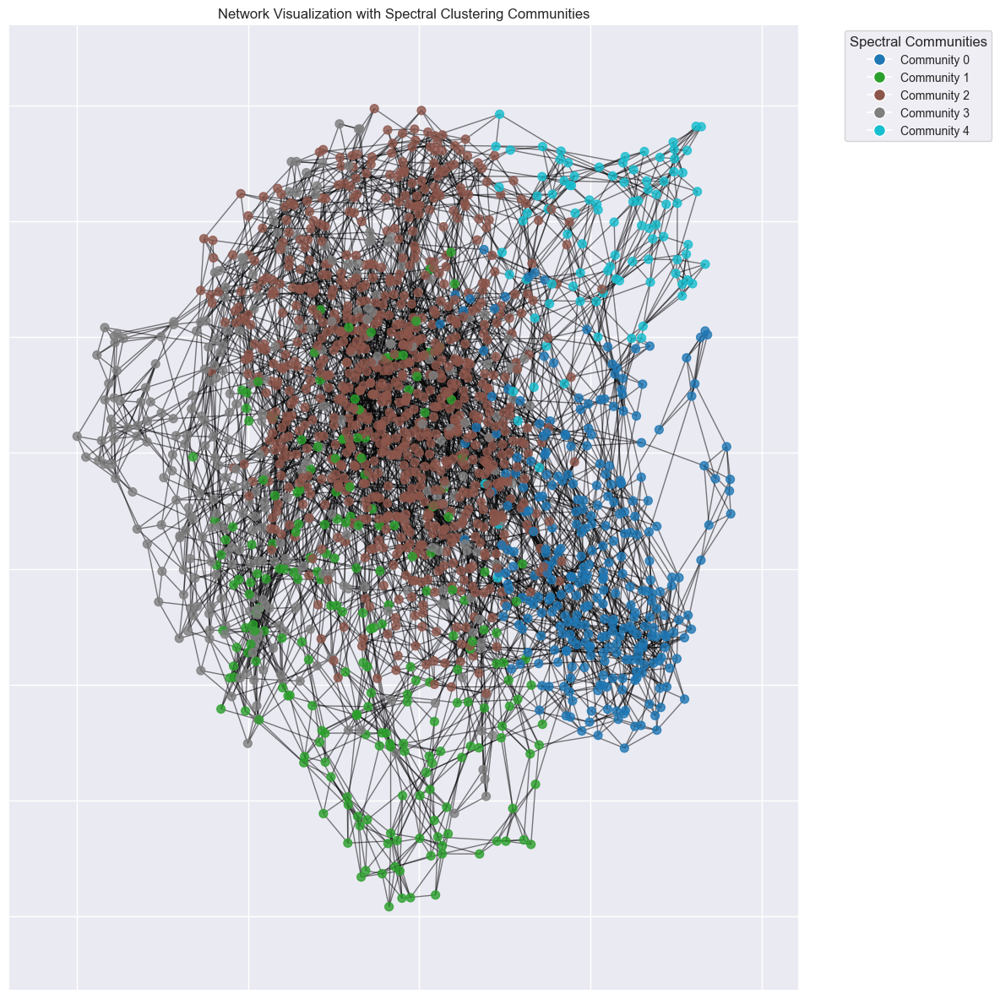

In [48]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Create a colormap for the spectral clustering communities
unique_communities = list(set(spectral_labels))
colormap = cm.get_cmap('tab10', len(unique_communities))
color_mapping = {community: colormap(i) for i, community in enumerate(unique_communities)}

# Draw the graph
pos = nx.spring_layout(G)  # Use spring layout for visualization
plt.figure(figsize=(12, 12))

# Assign colors to nodes based on their spectral clustering community
node_colors = [color_mapping[node_community_map[node]] for node in G.nodes()]
nx.draw_networkx_nodes(
    G, pos, node_size=50, node_color=node_colors, alpha=0.8
)
nx.draw_networkx_edges(G, pos, alpha=0.5)

# Add a legend for the spectral clustering communities
handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.rgb2hex(color), markersize=10, label=f'Community {community}')
    for community, color in color_mapping.items()
]
plt.legend(handles=handles, title="Spectral Communities", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')

# Add a title
plt.title("Network Visualization with Spectral Clustering Communities")
plt.tight_layout()
plt.show()


# Random forest with Community-Awareness Features

In [52]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler


# Convert the partition dictionary to a list of community assignments
community_assignments = [community for _, community in sorted(partition.items())]

# Ensure X_train is a DataFrame (if it's not already), and add the community column
X_train_new = pd.DataFrame(X_train)  # Convert X_train to a DataFrame if it's not already
X_train_new['community'] = community_assignments


# Add community-aware features as new columns
community_feature_names = [
    "normalized_within_module_degree",
    "participation_coefficient",
    "community_association_strength",
]
community_feature_df = pd.DataFrame(
    community_feature_matrix_aligned,
    columns=community_feature_names,
    index=X_train_new.index,
)
X_train_new = pd.concat([X_train_new, community_feature_df], axis=1)

X_train_new.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,community,normalized_within_module_degree,participation_coefficient,community_association_strength
0,Hispanic,Female,6,6,1,7,4,NaN,52,0,8,0,0,0,"Symptoms, signs, and ill-defined conditions","Endocrine, nutritional and metabolic diseases",Diseases of the circulatory system,3,>300,>8,No,No,No,No,Steady,No,No,No,No,No,Yes,0,0.040000,0.00,1.0
1,Caucasian,Female,8,3,3,1,3,MC,39,1,33,0,0,1,Diseases of the musculoskeletal system and con...,"Endocrine, nutritional and metabolic diseases",Diseases of the circulatory system,5,NaN,NaN,Steady,No,No,No,No,Steady,No,No,Steady,Ch,Yes,1,0.043478,0.00,1.0
2,Caucasian,Female,6,3,1,1,1,BC,1,1,8,0,0,0,Injury and poisoning,"Endocrine, nutritional and metabolic diseases",Diseases of the musculoskeletal system and con...,6,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,2,0.047619,0.00,1.0
3,AfricanAmerican,Female,8,6,1,17,4,NaN,55,3,21,0,0,0,Injury and poisoning,Diseases of the circulatory system,Diseases of the circulatory system,9,NaN,NaN,No,No,No,No,No,No,No,No,No,No,No,3,0.071429,0.00,1.0
4,Caucasian,Female,7,1,3,5,2,NaN,60,0,15,0,0,1,"Symptoms, signs, and ill-defined conditions",Diseases of the genitourinary system,"Symptoms, signs, and ill-defined conditions",9,NaN,NaN,No,No,No,No,Steady,No,No,No,No,No,Yes,4,0.010101,0.32,0.2



Cross-Validation Metrics Summary:
      Metric      Mean   Std Dev
0   Accuracy  0.417369  0.022271
1  Precision  0.413811  0.022242
2     Recall  0.417305  0.022051
3   F1 Score  0.413639  0.021817


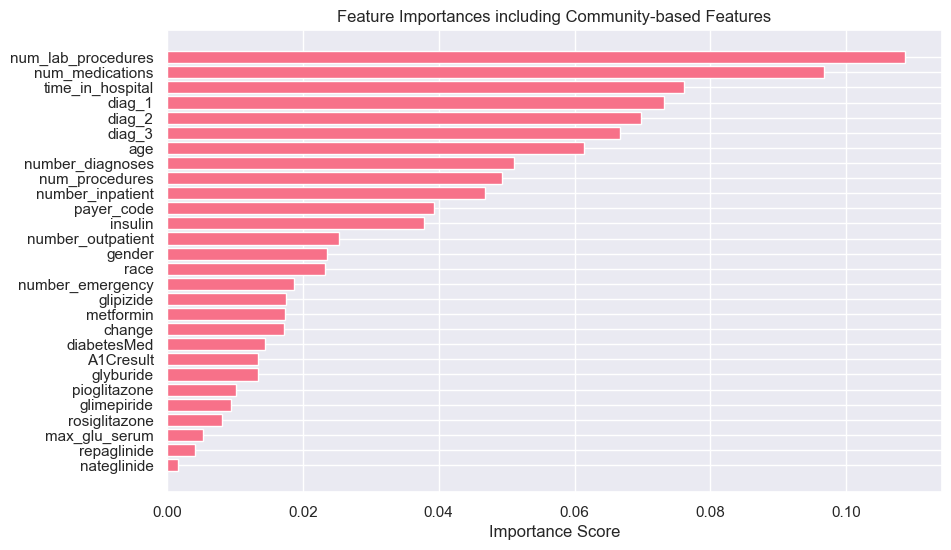


Top 10 Important Features:
num_lab_procedures: 0.1087
num_medications: 0.0968
time_in_hospital: 0.0760
diag_1: 0.0732
diag_2: 0.0698
diag_3: 0.0667
age: 0.0613
number_diagnoses: 0.0510
num_procedures: 0.0493
number_inpatient: 0.0468


In [53]:
import numpy as np
import pandas as pd  # For creating the results table
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier

# Define Stratified K-Fold Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize containers for metrics and feature importances
metrics = {"accuracy": [], "precision": [], "recall": [], "f1_score": []}
all_feature_importances = []

# Full pipeline (Preprocessing + Random Forest)
model_pipeline = Pipeline([
    ('preprocessor', full_pipeline),
    ('classifier', RandomForestClassifier(n_estimators=500, random_state=42))
])

# Perform Stratified K-Fold cross-validation
for train_idx, val_idx in cv.split(X_train_new, y_train):
    # Split data into training and validation sets
    X_train_fold, X_val_fold = X_train_new.iloc[train_idx], X_train_new.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Fit the model pipeline (preprocessing + classifier)
    model_pipeline.fit(X_train_fold, y_train_fold)

    # Make predictions on the validation set
    y_pred = model_pipeline.predict(X_val_fold)

    # Calculate metrics for the fold
    metrics["accuracy"].append(accuracy_score(y_val_fold, y_pred))
    metrics["precision"].append(precision_score(y_val_fold, y_pred, average='macro'))
    metrics["recall"].append(recall_score(y_val_fold, y_pred, average='macro'))
    metrics["f1_score"].append(f1_score(y_val_fold, y_pred, average='macro'))

    # Extract feature importances from the Random Forest classifier
    rf_importances = model_pipeline.named_steps['classifier'].feature_importances_
    all_feature_importances.append(rf_importances)

# Aggregate metrics across folds
results_summary = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "Mean": [np.mean(metrics["accuracy"]),
             np.mean(metrics["precision"]),
             np.mean(metrics["recall"]),
             np.mean(metrics["f1_score"])],
    "Std Dev": [np.std(metrics["accuracy"]),
                np.std(metrics["precision"]),
                np.std(metrics["recall"]),
                np.std(metrics["f1_score"])]
}
results_table = pd.DataFrame(results_summary)

# Display results table
print("\nCross-Validation Metrics Summary:")
print(results_table)

# Aggregate feature importances across folds (mean)
aggregated_importances = np.mean(all_feature_importances, axis=0)

# Get feature names
original_feature_names = X_num + X_cat + X_diag + community_feature_names

# Sort the feature importances in descending order and get the corresponding feature names
sorted_idx = np.argsort(aggregated_importances)[::-1]

# Plot the feature importances with original feature names
plt.figure(figsize=(10, 6))
plt.barh(range(len(aggregated_importances)), aggregated_importances[sorted_idx], align="center")
plt.yticks(range(len(aggregated_importances)), [original_feature_names[i] for i in sorted_idx])
plt.xlabel("Importance Score")
plt.title("Feature Importances including Community-based Features")
plt.gca().invert_yaxis()  # Highest importance on top
plt.show()

# Print out top 10 feature names and their importance scores for debugging
print("\nTop 10 Important Features:")
for idx in range(10):
    print(f"{original_feature_names[sorted_idx[idx]]}: {aggregated_importances[sorted_idx[idx]]:.4f}")
